**1.Data Import and Library Integration**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pymoo

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.4/68.4 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.1/249.1 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.9 MB/s eta 0:00:00
  Created wheel for grapheme: filename=grapheme-0.6.0-py3-none-any.whl size=210082 sha256=759ea5b36c20b5acbde541b8b27b8b0013616fad51c1d39deabf58723ef6d0cb
  Stored in directory: /root/.cache/pip/wheels/01/e1/49/37e6bde9886439057450c494a79b0bef8bbe897a54aebfc757
Successfully built grapheme


In [ ]:
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import numpy as np
import gym
import tensorflow as tf
from collections import deque
import random
from sklearn.decomposition import PCA
import xgboost as xgb
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential, load_model
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import Huber
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import Problem
from pymoo.optimize import minimize
from pymoo.visualization.scatter import Scatter
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PolynomialMutation

In [ ]:
# upload dataset
file_path = '/content/drive/MyDrive/ERP29 Homogenization Optimization/matrix_f1_f2_200,000.csv'
data = pd.read_csv(file_path)
print(data.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


         y1         y2        x1        x2        x3        x4        x5  \
0  0.509838  29.871126  5.218985  5.397777  5.379121  5.034495  4.679806   
1  0.575812  21.760299  5.320928  5.758512  6.202190  6.213097  5.800003   
2  0.661856  23.925695  5.031183  4.988109  4.935486  5.071049  5.278536   
3  0.479243  29.308284  5.378384  5.912559  6.500275  6.716089  6.662687   
4  0.369678  28.512919  4.794109  4.602453  4.436202  4.273816  4.165630   

         x6        x7        x8  ...        x61        x62        x63  \
0  4.584021  4.663380  4.986155  ...  41.393265  46.727495  12.628864   
1  5.442692  5.487448  5.764109  ...  30.415500  45.615116  27.584300   
2  5.311304  5.211655  5.160902  ...  36.840886  18.470995  47.545833   
3  6.545332  6.298756  6.093468  ...  44.173243  24.883121  38.788141   
4  4.147377  3.913101  3.537255  ...  48.558070  27.261051  47.816105   

         x64        x65        x66        x67        x68        x69        x70  
0  43.017399  45.996712

**2.Model Training, Evaluation, and Optimization Workflow**

In [ ]:
### Model1 for y1 ###
# Prepare the data for Model1 (y1)
X = data.drop(columns=['y1', 'y2'])
y1 = data['y1']

# Split the data into training and testing sets for y1
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=42)

# Create a pipeline with StandardScaler and Lasso using the specified alpha
pipeline1 = make_pipeline(StandardScaler(), Lasso(alpha=0.0001, max_iter=10000))

# Fit the model on the training data
pipeline1.fit(X_train, y1_train)
model1 = pipeline1

# Predict on the test set for y1
y1_pred = model1.predict(X_test)

# Calculate Mean Squared Error (MSE) and R² on the test set for y1
mse_y1 = mean_squared_error(y1_test, y1_pred)
r2_y1 = r2_score(y1_test, y1_pred)

print("Model1 - y1:")
print("Alpha used:", 0.0001)
print("Mean Squared Error (MSE) on Test Set:", mse_y1)
print("R² Score on Test Set:", r2_y1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Model1 - y1:
Alpha used: 0.0001
Mean Squared Error (MSE) on Test Set: 0.07061951651827898
R² Score on Test Set: 0.09423043330559722


In [ ]:
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred,
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot for Model1 (y1)
plot_actual_vs_predicted(y1_test, y1_pred, "Actual vs Predicted y1 Values (Model1)", "Actual y1", "Predicted y1")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
X = data.drop(columns=['y1', 'y2'])
y2 = data['y2']

# Split the data into training and testing sets for y2
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=42)

# Create a pipeline with StandardScaler and Lasso using the specified alpha
pipeline2 = make_pipeline(StandardScaler(), Lasso(alpha=0.0001, max_iter=50000))

# Fit the model on the training data
pipeline2.fit(X_train, y2_train)
model2 = pipeline2

# Predict on the test set for y2
y2_pred = model2.predict(X_test)

# Calculate Mean Squared Error (MSE) and R² on the test set for y2
mse_y2 = mean_squared_error(y2_test, y2_pred)
r2_y2 = r2_score(y2_test, y2_pred)

print("Model2 - y2:")
print("Alpha used:", 0.0001)
print("Mean Squared Error (MSE) on Test Set:", mse_y2)
print("R² Score on Test Set:", r2_y2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Model2 - y2:
Alpha used: 0.0001
Mean Squared Error (MSE) on Test Set: 20.822323008410265
R² Score on Test Set: 0.02667279253373045


In [ ]:
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred,
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot for Model2 (y2)
plot_actual_vs_predicted(y2_test, y2_pred, "Actual vs Predicted y2 Values (Model2)", "Actual y2", "Predicted y2")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -
     2 |      200 |     10 |  0.1765743458 |         ideal
     3 |      300 |     12 |  0.1572995914 |         ideal
     4 |      400 |     13 |  0.0157366283 |             f
     5 |      500 |     14 |  0.0467021334 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     6 |      600 |     16 |  0.0489151719 |         ideal
     7 |      700 |     16 |  0.0043255566 |         ideal
     8 |      800 |     17 |  0.0201546674 |             f
     9 |      900 |     17 |  0.0203657427 |         ideal
    10 |     1000 |     17 |  0.0025199054 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    11 |     1100 |     15 |  0.0329710824 |         ideal
    12 |     1200 |     15 |  0.000000E+00 |             f
    13 |     1300 |     18 |  0.0074117214 |         ideal
    14 |     1400 |     19 |  0.0097626610 |             f
    15 |     1500 |     19 |  0.0415304698 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    16 |     1600 |     22 |  0.0080798512 |             f
    17 |     1700 |     22 |  0.000000E+00 |             f
    18 |     1800 |     24 |  0.0031676125 |             f
    19 |     1900 |     24 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    20 |     2000 |     24 |  0.000000E+00 |             f
    21 |     2100 |     26 |  0.0019421705 |             f
    22 |     2200 |     26 |  0.0328329429 |         ideal
    23 |     2300 |     25 |  0.0013088364 |             f
    24 |     2400 |     26 |  0.0023662009 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    25 |     2500 |     30 |  0.0065806084 |             f
    26 |     2600 |     28 |  0.0039159671 |             f
    27 |     2700 |     27 |  0.0026146625 |             f
    28 |     2800 |     27 |  0.000000E+00 |             f
    29 |     2900 |     28 |  0.0061285362 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    30 |     3000 |     28 |  0.000000E+00 |             f
    31 |     3100 |     27 |  0.0011644612 |             f
    32 |     3200 |     27 |  0.0026337283 |             f
    33 |     3300 |     27 |  0.000000E+00 |             f
    34 |     3400 |     24 |  0.0955280484 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    35 |     3500 |     24 |  0.000000E+00 |             f
    36 |     3600 |     24 |  0.0056426387 |             f
    37 |     3700 |     24 |  0.0021133344 |             f
    38 |     3800 |     24 |  0.0021133344 |             f
    39 |     3900 |     26 |  0.0079980077 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    40 |     4000 |     29 |  0.0029815944 |             f
    41 |     4100 |     29 |  0.000000E+00 |             f
    42 |     4200 |     30 |  0.0008440643 |             f
    43 |     4300 |     28 |  0.0034969862 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    44 |     4400 |     28 |  0.000000E+00 |             f
    45 |     4500 |     27 |  0.0024922614 |             f
    46 |     4600 |     28 |  0.0045740147 |             f
    47 |     4700 |     29 |  0.0021058076 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    48 |     4800 |     30 |  0.0025977662 |             f
    49 |     4900 |     31 |  0.0034351620 |             f
    50 |     5000 |     33 |  0.0005742673 |             f
    51 |     5100 |     33 |  0.0005742673 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    52 |     5200 |     33 |  0.0005742673 |             f
    53 |     5300 |     35 |  0.0070471432 |         ideal
    54 |     5400 |     32 |  0.0019384525 |             f
    55 |     5500 |     30 |  0.0025503484 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    56 |     5600 |     27 |  0.0041479266 |             f
    57 |     5700 |     27 |  0.000000E+00 |             f
    58 |     5800 |     27 |  0.0010378414 |             f
    59 |     5900 |     28 |  0.0021781161 |             f
    60 |     6000 |     27 |  0.0085242577 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    61 |     6100 |     27 |  0.000000E+00 |             f
    62 |     6200 |     27 |  0.0008179799 |             f
    63 |     6300 |     28 |  0.0019586530 |             f
    64 |     6400 |     28 |  0.0053491479 |             f
    65 |     6500 |     28 |  0.0021057020 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    66 |     6600 |     28 |  0.0021057020 |             f
    67 |     6700 |     28 |  0.0029389526 |             f
    68 |     6800 |     30 |  0.1427274420 |         nadir
    69 |     6900 |     29 |  0.0012094319 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    70 |     7000 |     29 |  0.0019040810 |             f
    71 |     7100 |     29 |  0.0019040810 |             f
    72 |     7200 |     29 |  0.0019040810 |             f
    73 |     7300 |     30 |  0.0026302483 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    74 |     7400 |     30 |  0.000000E+00 |             f
    75 |     7500 |     30 |  0.000000E+00 |             f
    76 |     7600 |     30 |  0.000000E+00 |             f
    77 |     7700 |     32 |  0.0007534525 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    78 |     7800 |     32 |  0.0007534525 |             f
    79 |     7900 |     30 |  0.0016973496 |             f
    80 |     8000 |     30 |  0.0016973496 |             f
    81 |     8100 |     30 |  0.0016973496 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    82 |     8200 |     33 |  0.0027784445 |             f
    83 |     8300 |     33 |  0.000000E+00 |             f
    84 |     8400 |     33 |  0.000000E+00 |             f
    85 |     8500 |     34 |  0.0004028369 |             f
    86 |     8600 |     34 |  0.0004028369 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    87 |     8700 |     34 |  0.0004028369 |             f
    88 |     8800 |     34 |  0.0004028369 |             f
    89 |     8900 |     34 |  0.0004028369 |             f
    90 |     9000 |     35 |  0.0006925311 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    91 |     9100 |     35 |  0.0006925311 |             f
    92 |     9200 |     35 |  0.0006925311 |             f
    93 |     9300 |     35 |  0.0006925311 |             f
    94 |     9400 |     35 |  0.0006925311 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    95 |     9500 |     35 |  0.0006925311 |             f
    96 |     9600 |     35 |  0.0006925311 |             f
    97 |     9700 |     35 |  0.0006925311 |             f
    98 |     9800 |     35 |  0.0006925311 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    99 |     9900 |     35 |  0.0006925311 |             f
   100 |    10000 |     35 |  0.0006925311 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      7 |             - |             -
     2 |      200 |     11 |  0.0337895103 |             f
     3 |      300 |     11 |  0.0127579311 |         ideal
     4 |      400 |     11 |  0.000000E+00 |             f
     5 |      500 |     12 |  0.1272946609 |         ideal
     6 |      600 |     14 |  0.0066663706 |             f
     7 |      700 |     14 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     8 |      800 |     13 |  0.0072584602 |             f
     9 |      900 |     15 |  0.0062606170 |         ideal
    10 |     1000 |     15 |  0.000000E+00 |             f
    11 |     1100 |     16 |  0.0324270520 |         ideal
    12 |     1200 |     16 |  0.1079495646 |         ideal
    13 |     1300 |     16 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    14 |     1400 |     18 |  0.0038356695 |             f
    15 |     1500 |     19 |  0.0210950918 |         ideal
    16 |     1600 |     17 |  0.0076118044 |             f
    17 |     1700 |     18 |  0.0014873602 |             f
    18 |     1800 |     19 |  0.0045760601 |             f
    19 |     1900 |     18 |  0.0058212575 |             f
    20 |     2000 |     19 |  0.0035175410 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    21 |     2100 |     20 |  0.0005375790 |             f
    22 |     2200 |     19 |  0.0083598643 |             f
    23 |     2300 |     19 |  0.0050602493 |             f
    24 |     2400 |     20 |  0.0020653747 |             f
    25 |     2500 |     21 |  0.0025371258 |             f
    26 |     2600 |     21 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    27 |     2700 |     22 |  0.0003836416 |             f
    28 |     2800 |     22 |  0.0003836416 |             f
    29 |     2900 |     22 |  0.0003836416 |             f
    30 |     3000 |     23 |  0.0009896040 |             f
    31 |     3100 |     23 |  0.0009896040 |             f
    32 |     3200 |     23 |  0.0009896040 |             f
    33 |     3300 |     23 |  0.0009896040 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    34 |     3400 |     23 |  0.0009896040 |             f
    35 |     3500 |     23 |  0.0009896040 |             f
    36 |     3600 |     23 |  0.0018923749 |             f
    37 |     3700 |     24 |  0.0025859923 |             f
    38 |     3800 |     24 |  0.000000E+00 |             f
    39 |     3900 |     24 |  0.000000E+00 |             f
    40 |     4000 |     24 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    41 |     4100 |     25 |  0.0012425271 |             f
    42 |     4200 |     25 |  0.0012425271 |             f
    43 |     4300 |     25 |  0.0014130629 |             f
    44 |     4400 |     25 |  0.0014130629 |             f
    45 |     4500 |     25 |  0.0014130629 |             f
    46 |     4600 |     25 |  0.0014130629 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    47 |     4700 |     25 |  0.0014130629 |             f
    48 |     4800 |     25 |  0.0014130629 |             f
    49 |     4900 |     25 |  0.0014130629 |             f
    50 |     5000 |     25 |  0.0014130629 |             f
    51 |     5100 |     26 |  0.0015993554 |             f
    52 |     5200 |     26 |  0.0015993554 |             f
    53 |     5300 |     26 |  0.0015993554 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    54 |     5400 |     26 |  0.0015993554 |             f
    55 |     5500 |     26 |  0.0015993554 |             f
    56 |     5600 |     26 |  0.0015993554 |             f
    57 |     5700 |     26 |  0.0015993554 |             f
    58 |     5800 |     26 |  0.0015993554 |             f
    59 |     5900 |     26 |  0.0015993554 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    60 |     6000 |     26 |  0.0015993554 |             f
    61 |     6100 |     26 |  0.0015993554 |             f
    62 |     6200 |     26 |  0.0015993554 |             f
    63 |     6300 |     26 |  0.0015993554 |             f
    64 |     6400 |     26 |  0.0015993554 |             f
    65 |     6500 |     27 |  0.0018291923 |             f
    66 |     6600 |     27 |  0.0018291923 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    67 |     6700 |     27 |  0.0018291923 |             f
    68 |     6800 |     26 |  0.0024705564 |             f
    69 |     6900 |     26 |  0.0024705564 |             f
    70 |     7000 |     26 |  0.0024705564 |             f
    71 |     7100 |     26 |  0.0024705564 |             f
    72 |     7200 |     26 |  0.0024705564 |             f
    73 |     7300 |     26 |  0.0024705564 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    74 |     7400 |     26 |  0.0024705564 |             f
    75 |     7500 |     26 |  0.0024705564 |             f
    76 |     7600 |     26 |  0.0024705564 |             f
    77 |     7700 |     26 |  0.0024705564 |             f
    78 |     7800 |     26 |  0.0024705564 |             f
    79 |     7900 |     26 |  0.0024705564 |             f
    80 |     8000 |     26 |  0.0024705564 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    81 |     8100 |     26 |  0.0024705564 |             f
    82 |     8200 |     26 |  0.0024705564 |             f
    83 |     8300 |     26 |  0.0024705564 |             f
    84 |     8400 |     26 |  0.0024705564 |             f
    85 |     8500 |     26 |  0.0024705564 |             f
    86 |     8600 |     26 |  0.0024705564 |             f
    87 |     8700 |     26 |  0.0024705564 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    88 |     8800 |     26 |  0.0024705564 |             f
    89 |     8900 |     26 |  0.0024705564 |             f
    90 |     9000 |     26 |  0.0024705564 |             f
    91 |     9100 |     26 |  0.0024705564 |             f
    92 |     9200 |     26 |  0.0024705564 |             f
    93 |     9300 |     26 |  0.0024705564 |             f
    94 |     9400 |     26 |  0.0024705564 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    95 |     9500 |     26 |  0.0024705564 |             f
    96 |     9600 |     26 |  0.0024705564 |             f
    97 |     9700 |     26 |  0.0024705564 |             f
    98 |     9800 |     26 |  0.0024705564 |             f
    99 |     9900 |     26 |  0.0024705564 |             f
   100 |    10000 |     26 |  0.0024705564 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      7 |             - |             -


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     2 |      200 |     10 |  0.0544160592 |         ideal
     3 |      300 |     11 |  0.0300377596 |         ideal
     4 |      400 |     12 |  0.0009692471 |             f
     5 |      500 |     12 |  0.1591245433 |         ideal
     6 |      600 |     13 |  0.0016428857 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     7 |      700 |     10 |  0.0097467117 |             f
     8 |      800 |     10 |  0.0370722666 |         ideal
     9 |      900 |     12 |  0.0656820630 |         ideal
    10 |     1000 |     13 |  0.0041318071 |             f
    11 |     1100 |     13 |  0.000000E+00 |             f
    12 |     1200 |     14 |  0.0117939427 |             f
    13 |     1300 |     14 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    14 |     1400 |     14 |  0.000000E+00 |             f
    15 |     1500 |     15 |  0.0047031318 |             f
    16 |     1600 |     15 |  0.000000E+00 |             f
    17 |     1700 |     15 |  0.000000E+00 |             f
    18 |     1800 |     15 |  0.0060878941 |             f
    19 |     1900 |     15 |  0.000000E+00 |             f
    20 |     2000 |     15 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    21 |     2100 |     15 |  0.0089712926 |             f
    22 |     2200 |     15 |  0.000000E+00 |             f
    23 |     2300 |     16 |  0.0071199537 |         ideal
    24 |     2400 |     17 |  0.0344029844 |         ideal
    25 |     2500 |     17 |  0.000000E+00 |             f
    26 |     2600 |     18 |  0.0238255908 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    27 |     2700 |     18 |  0.000000E+00 |             f
    28 |     2800 |     18 |  0.000000E+00 |             f
    29 |     2900 |     18 |  0.000000E+00 |             f
    30 |     3000 |     18 |  0.000000E+00 |             f
    31 |     3100 |     19 |  0.0009861519 |             f
    32 |     3200 |     19 |  0.0009861519 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    33 |     3300 |     19 |  0.0009861519 |             f
    34 |     3400 |     19 |  0.0009861519 |             f
    35 |     3500 |     20 |  0.0014026653 |             f
    36 |     3600 |     20 |  0.0014026653 |             f
    37 |     3700 |     21 |  0.1422830299 |         nadir
    38 |     3800 |     21 |  0.000000E+00 |             f
    39 |     3900 |     21 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    40 |     4000 |     22 |  0.0180958024 |         ideal
    41 |     4100 |     22 |  0.000000E+00 |             f
    42 |     4200 |     22 |  0.000000E+00 |             f
    43 |     4300 |     22 |  0.000000E+00 |             f
    44 |     4400 |     22 |  0.000000E+00 |             f
    45 |     4500 |     22 |  0.000000E+00 |             f
    46 |     4600 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    47 |     4700 |     23 |  0.0061942765 |         ideal
    48 |     4800 |     23 |  0.0039750012 |         ideal
    49 |     4900 |     23 |  0.000000E+00 |             f
    50 |     5000 |     23 |  0.000000E+00 |             f
    51 |     5100 |     23 |  0.000000E+00 |             f
    52 |     5200 |     23 |  0.000000E+00 |             f
    53 |     5300 |     24 |  0.0008508370 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    54 |     5400 |     25 |  0.0013383644 |             f
    55 |     5500 |     26 |  0.0015781082 |             f
    56 |     5600 |     26 |  0.0015781082 |             f
    57 |     5700 |     26 |  0.0015781082 |             f
    58 |     5800 |     26 |  0.0027102424 |             f
    59 |     5900 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    60 |     6000 |     26 |  0.000000E+00 |             f
    61 |     6100 |     26 |  0.000000E+00 |             f
    62 |     6200 |     26 |  0.000000E+00 |             f
    63 |     6300 |     26 |  0.000000E+00 |             f
    64 |     6400 |     26 |  0.000000E+00 |             f
    65 |     6500 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    66 |     6600 |     26 |  0.000000E+00 |             f
    67 |     6700 |     26 |  0.000000E+00 |             f
    68 |     6800 |     26 |  0.000000E+00 |             f
    69 |     6900 |     26 |  0.000000E+00 |             f
    70 |     7000 |     26 |  0.000000E+00 |             f
    71 |     7100 |     26 |  0.000000E+00 |             f
    72 |     7200 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    73 |     7300 |     26 |  0.0031221167 |             f
    74 |     7400 |     26 |  0.000000E+00 |             f
    75 |     7500 |     27 |  0.0007204849 |             f
    76 |     7600 |     27 |  0.0007204849 |             f
    77 |     7700 |     28 |  0.0014084491 |             f
    78 |     7800 |     27 |  0.0021486670 |             f
    79 |     7900 |     27 |  0.0021486670 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    80 |     8000 |     27 |  0.0021486670 |             f
    81 |     8100 |     27 |  0.0021486670 |             f
    82 |     8200 |     27 |  0.0021486670 |             f
    83 |     8300 |     29 |  0.0037067721 |             f
    84 |     8400 |     29 |  0.000000E+00 |             f
    85 |     8500 |     29 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    86 |     8600 |     29 |  0.000000E+00 |             f
    87 |     8700 |     29 |  0.000000E+00 |             f
    88 |     8800 |     30 |  0.0010161051 |             f
    89 |     8900 |     30 |  0.0010161051 |             f
    90 |     9000 |     30 |  0.0010161051 |             f
    91 |     9100 |     30 |  0.0010608206 |             f
    92 |     9200 |     30 |  0.0010608206 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    93 |     9300 |     30 |  0.0010608206 |             f
    94 |     9400 |     30 |  0.0010608206 |             f
    95 |     9500 |     28 |  0.0026992089 |             f
    96 |     9600 |     28 |  0.000000E+00 |             f
    97 |     9700 |     28 |  0.000000E+00 |             f
    98 |     9800 |     30 |  0.0008213168 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    99 |     9900 |     30 |  0.0008213168 |             f
   100 |    10000 |     30 |  0.0008213168 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      6 |             - |             -
     2 |      200 |     10 |  0.0583436458 |         ideal
     3 |      300 |      7 |  0.0590454838 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     4 |      400 |      5 |  0.0073664817 |         ideal
     5 |      500 |      5 |  0.000000E+00 |             f
     6 |      600 |      6 |  0.1568783638 |         ideal
     7 |      700 |      6 |  0.0547499593 |         ideal
     8 |      800 |      7 |  0.0181648214 |             f
     9 |      900 |      8 |  0.0095854657 |             f
    10 |     1000 |      8 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    11 |     1100 |      9 |  0.0041558476 |             f
    12 |     1200 |      9 |  0.000000E+00 |             f
    13 |     1300 |     12 |  0.1256971256 |         ideal
    14 |     1400 |     13 |  0.0030894438 |             f
    15 |     1500 |     13 |  0.000000E+00 |             f
    16 |     1600 |     13 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    17 |     1700 |     13 |  0.000000E+00 |             f
    18 |     1800 |     13 |  0.000000E+00 |             f
    19 |     1900 |     13 |  0.000000E+00 |             f
    20 |     2000 |     13 |  0.000000E+00 |             f
    21 |     2100 |     14 |  0.0015738874 |             f
    22 |     2200 |     13 |  0.0033605357 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    23 |     2300 |     14 |  0.0043486502 |             f
    24 |     2400 |     15 |  0.0126022819 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    25 |     2500 |     15 |  0.0021736724 |             f
    26 |     2600 |     15 |  0.0021736724 |             f
    27 |     2700 |     15 |  0.0021736724 |             f
    28 |     2800 |     17 |  0.0363873813 |         ideal
    29 |     2900 |     17 |  0.000000E+00 |             f
    30 |     3000 |     18 |  0.0016073676 |             f
    31 |     3100 |     18 |  0.0209884306 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    32 |     3200 |     19 |  0.0124896673 |         ideal
    33 |     3300 |     19 |  0.000000E+00 |             f
    34 |     3400 |     20 |  0.0279796033 |         ideal
    35 |     3500 |     20 |  0.0006804995 |             f
    36 |     3600 |     20 |  0.0006804995 |             f
    37 |     3700 |     21 |  0.0024514257 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    38 |     3800 |     23 |  0.0062085079 |         ideal
    39 |     3900 |     23 |  0.000000E+00 |             f
    40 |     4000 |     23 |  0.000000E+00 |             f
    41 |     4100 |     23 |  0.000000E+00 |             f
    42 |     4200 |     23 |  0.0003765158 |             f
    43 |     4300 |     23 |  0.0003765158 |             f
    44 |     4400 |     24 |  0.0014593121 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    45 |     4500 |     24 |  0.0018657253 |             f
    46 |     4600 |     26 |  0.0102546038 |         ideal
    47 |     4700 |     26 |  0.000000E+00 |             f
    48 |     4800 |     26 |  0.000000E+00 |             f
    49 |     4900 |     26 |  0.000000E+00 |             f
    50 |     5000 |     26 |  0.000000E+00 |             f
    51 |     5100 |     27 |  0.0018043069 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    52 |     5200 |     27 |  0.0018043069 |             f
    53 |     5300 |     22 |  0.0054943864 |             f
    54 |     5400 |     22 |  0.000000E+00 |             f
    55 |     5500 |     19 |  0.0012294185 |             f
    56 |     5600 |     20 |  0.0042303149 |             f
    57 |     5700 |     20 |  0.000000E+00 |             f
    58 |     5800 |     21 |  0.0012213993 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    59 |     5900 |     21 |  0.0012213993 |             f
    60 |     6000 |     21 |  0.0012213993 |             f
    61 |     6100 |     21 |  0.0019324580 |             f
    62 |     6200 |     22 |  0.0041045922 |             f
    63 |     6300 |     22 |  0.000000E+00 |             f
    64 |     6400 |     24 |  0.0018867043 |             f
    65 |     6500 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    66 |     6600 |     24 |  0.0018867043 |             f
    67 |     6700 |     24 |  0.0018867043 |             f
    68 |     6800 |     24 |  0.0018867043 |             f
    69 |     6900 |     24 |  0.0018867043 |             f
    70 |     7000 |     24 |  0.0018867043 |             f
    71 |     7100 |     24 |  0.0018867043 |             f
    72 |     7200 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    73 |     7300 |     24 |  0.0018867043 |             f
    74 |     7400 |     24 |  0.0018867043 |             f
    75 |     7500 |     24 |  0.0018867043 |             f
    76 |     7600 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    77 |     7700 |     24 |  0.0018867043 |             f
    78 |     7800 |     24 |  0.0018867043 |             f
    79 |     7900 |     24 |  0.0018867043 |             f
    80 |     8000 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    81 |     8100 |     24 |  0.0018867043 |             f
    82 |     8200 |     24 |  0.0018867043 |             f
    83 |     8300 |     24 |  0.0018867043 |             f
    84 |     8400 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    85 |     8500 |     24 |  0.0018867043 |             f
    86 |     8600 |     24 |  0.0018867043 |             f
    87 |     8700 |     24 |  0.0018867043 |             f
    88 |     8800 |     24 |  0.0018867043 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    89 |     8900 |     24 |  0.0018867043 |             f
    90 |     9000 |     24 |  0.0018867043 |             f
    91 |     9100 |     24 |  0.0018867043 |             f
    92 |     9200 |     24 |  0.0021865244 |             f
    93 |     9300 |     24 |  0.0021865244 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    94 |     9400 |     24 |  0.0026930303 |             f
    95 |     9500 |     24 |  0.000000E+00 |             f
    96 |     9600 |     24 |  0.000000E+00 |             f
    97 |     9700 |     24 |  0.000000E+00 |             f
    98 |     9800 |     24 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    99 |     9900 |     24 |  0.000000E+00 |             f
   100 |    10000 |     26 |  0.0011737249 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -
     2 |      200 |      4 |  0.0121490848 |         ideal
     3 |      300 |      6 |  0.1749839289 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

     4 |      400 |      6 |  0.0252513030 |             f
     5 |      500 |      8 |  0.0364299043 |             f
     6 |      600 |     11 |  0.0405345540 |             f
     7 |      700 |     10 |  0.0380256394 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

     8 |      800 |     11 |  0.0090204894 |             f
     9 |      900 |     12 |  0.0093139486 |             f
    10 |     1000 |     12 |  0.0460681827 |         ideal
    11 |     1100 |     15 |  0.0080368962 |             f
    12 |     1200 |     18 |  0.0844709290 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    13 |     1300 |     19 |  0.0025750379 |             f
    14 |     1400 |     20 |  0.0027506584 |             f
    15 |     1500 |     21 |  0.0033389851 |             f
    16 |     1600 |     21 |  0.000000E+00 |             f
    17 |     1700 |     21 |  0.0908287336 |         nadir


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    18 |     1800 |     22 |  0.0052582601 |             f
    19 |     1900 |     22 |  0.000000E+00 |             f
    20 |     2000 |     23 |  0.0757786834 |         nadir
    21 |     2100 |     23 |  0.000000E+00 |             f
    22 |     2200 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    23 |     2300 |     23 |  0.000000E+00 |             f
    24 |     2400 |     23 |  0.000000E+00 |             f
    25 |     2500 |     23 |  0.0005535709 |             f
    26 |     2600 |     23 |  0.0005535709 |             f
    27 |     2700 |     22 |  0.0075011912 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    28 |     2800 |     22 |  0.000000E+00 |             f
    29 |     2900 |     23 |  0.0021934017 |             f
    30 |     3000 |     23 |  0.0021934017 |             f
    31 |     3100 |     22 |  0.0252606760 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    32 |     3200 |     23 |  0.0002550210 |             f
    33 |     3300 |     24 |  0.0009536148 |             f
    34 |     3400 |     25 |  0.0058687719 |         ideal
    35 |     3500 |     25 |  0.000000E+00 |             f
    36 |     3600 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    37 |     3700 |     26 |  0.0012592417 |             f
    38 |     3800 |     26 |  0.0024248410 |             f
    39 |     3900 |     26 |  0.0024248410 |             f
    40 |     4000 |     27 |  0.0809480975 |         ideal


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    41 |     4100 |     27 |  0.000000E+00 |             f
    42 |     4200 |     27 |  0.000000E+00 |             f
    43 |     4300 |     27 |  0.000000E+00 |             f
    44 |     4400 |     29 |  0.0016551320 |             f
    45 |     4500 |     29 |  0.0016551320 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    46 |     4600 |     28 |  0.0038463434 |             f
    47 |     4700 |     28 |  0.000000E+00 |             f
    48 |     4800 |     27 |  0.0024528987 |             f
    49 |     4900 |     27 |  0.0024528987 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    50 |     5000 |     27 |  0.0028124611 |             f
    51 |     5100 |     27 |  0.000000E+00 |             f
    52 |     5200 |     29 |  0.0017154884 |             f
    53 |     5300 |     29 |  0.0017154884 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    54 |     5400 |     29 |  0.0017154884 |             f
    55 |     5500 |     27 |  0.0023595099 |             f
    56 |     5600 |     28 |  0.0163594384 |         ideal
    57 |     5700 |     29 |  0.0015782163 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    58 |     5800 |     30 |  0.0028364024 |             f
    59 |     5900 |     30 |  0.000000E+00 |             f
    60 |     6000 |     31 |  0.0003327640 |             f
    61 |     6100 |     31 |  0.0003327640 |             f
    62 |     6200 |     31 |  0.0003327640 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/l

    63 |     6300 |     31 |  0.0003327640 |             f
    64 |     6400 |     31 |  0.0003327640 |             f
    65 |     6500 |     32 |  0.0017190784 |             f
    66 |     6600 |     31 |  0.0020980763 |             f
    67 |     6700 |     32 |  0.0031026856 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    68 |     6800 |     32 |  0.000000E+00 |             f
    69 |     6900 |     32 |  0.000000E+00 |             f
    70 |     7000 |     32 |  0.000000E+00 |             f
    71 |     7100 |     32 |  0.000000E+00 |             f
    72 |     7200 |     32 |  0.000000E+00 |             f
    73 |     7300 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    74 |     7400 |     32 |  0.000000E+00 |             f
    75 |     7500 |     32 |  0.000000E+00 |             f
    76 |     7600 |     32 |  0.000000E+00 |             f
    77 |     7700 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    78 |     7800 |     32 |  0.000000E+00 |             f
    79 |     7900 |     32 |  0.000000E+00 |             f
    80 |     8000 |     32 |  0.000000E+00 |             f
    81 |     8100 |     32 |  0.000000E+00 |             f
    82 |     8200 |     32 |  0.000000E+00 |             f
    83 |     8300 |     32 |  0.000000E+00 |             f
    84 |     8400 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    85 |     8500 |     32 |  0.000000E+00 |             f
    86 |     8600 |     32 |  0.000000E+00 |             f
    87 |     8700 |     32 |  0.0004024890 |             f
    88 |     8800 |     32 |  0.0004024890 |             f
    89 |     8900 |     32 |  0.0004024890 |             f
    90 |     9000 |     32 |  0.0008122729 |             f
    91 |     9100 |     32 |  0.0008122729 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/l

    92 |     9200 |     32 |  0.0008122729 |             f
    93 |     9300 |     32 |  0.0008122729 |             f
    94 |     9400 |     32 |  0.0008122729 |             f
    95 |     9500 |     32 |  0.0008122729 |             f
    96 |     9600 |     32 |  0.0008122729 |             f
    97 |     9700 |     32 |  0.0008122729 |             f
    98 |     9800 |     32 |  0.0008122729 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |     32 |  0.0008122729 |             f
   100 |    10000 |     32 |  0.0008122729 |             f


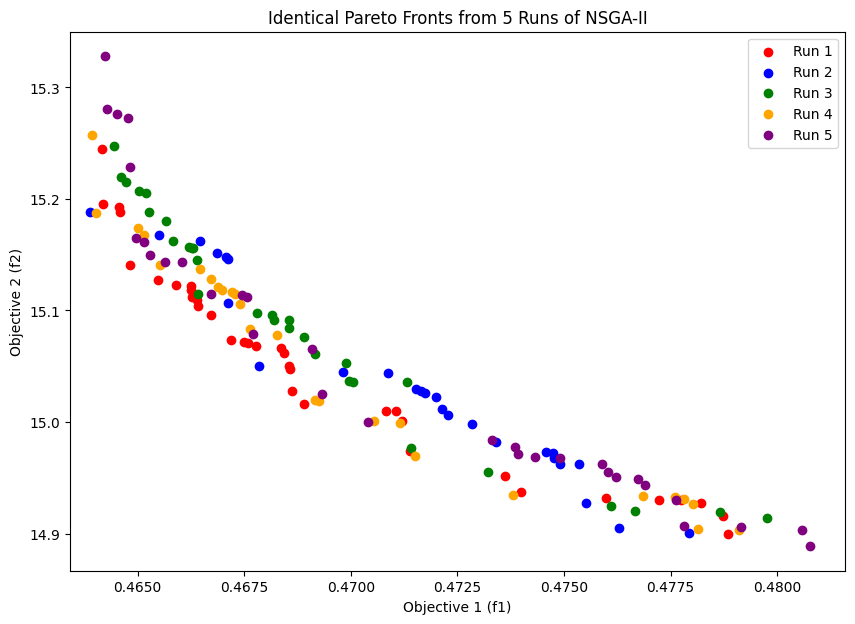

In [ ]:
# Extract the initial values from row 14 for columns X1-X50
initial_values = data.iloc[13, 2:52].values  # Extracting X1-X50 from row 14

# Define the optimization problem
class F1F2Problem(Problem):
    def __init__(self, model_y1, model_y2, initial_values):
        n_var = 70  # Total number of features
        xl_x1_x50 = initial_values  # Fix X1-X50
        xu_x1_x50 = initial_values  # Fix X1-X50

        # Define the range for X51-X70 (10 to 49)
        xl_x51_x70 = np.full(20, 10)
        xu_x51_x70 = np.full(20, 49)

        # Combine all the variable bounds
        xl = np.concatenate((xl_x1_x50, xl_x51_x70))
        xu = np.concatenate((xu_x1_x50, xu_x51_x70))

        super().__init__(n_var=n_var, n_obj=2, n_constr=0, xl=xl, xu=xu)
        self.model_y1 = model_y1
        self.model_y2 = model_y2

    def _evaluate(self, X, out, *args, **kwargs):
        # Scale the input data
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        # Predict F1 and F2 using the trained Lasso models
        f1 = self.model_y1.predict(X_scaled)
        f2 = self.model_y2.predict(X_scaled)
        out["F"] = np.column_stack([f1, f2])

# Create the problem instance for model1 and model2
problem = F1F2Problem(model_y1=model1, model_y2=model2, initial_values=initial_values)

# Define the algorithm with updated parameters
algorithm = NSGA2(
    pop_size=100,  # Population size
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.95, eta=10),  # Crossover probability and eta
    mutation=PolynomialMutation(prob=0.25, eta=25)  # Mutation rate
)

# Set up colors for the different runs
colors = ['red', 'blue', 'green', 'orange', 'purple']

# Set a fixed seed for all runs to make them identical
fixed_seed = 42

# Create a figure for the combined plot
plt.figure(figsize=(10, 7))

# Loop to run the optimization 5 times and plot the Pareto fronts in different colors
for i in range(5):
    # Execute the optimization with the fixed seed
    res = minimize(problem, algorithm, ('n_gen', 100), seed=fixed_seed + i, save_history=True, verbose=True)

    # Plot the Pareto Frontier for this run in a different color
    plt.scatter(res.F[:, 0], res.F[:, 1], color=colors[i], label=f'Run {i+1}')

# Calculate the min and max values for f1 and f2 across all runs
f1_min, f1_max = res.F[:, 0].min(), res.F[:, 0].max()
f2_min, f2_max = res.F[:, 1].min(), res.F[:, 1].max()

# Add some padding for better visualization
f1_range = f1_max - f1_min
f2_range = f2_max - f2_min

plt.xlim(f1_min - 0.05 * f1_range, f1_max + 0.05 * f1_range)  # Set the range for f1 on the x-axis
plt.ylim(f2_min - 0.05 * f2_range, f2_max + 0.05 * f2_range)  # Set the range for f2 on the y-axis

# Add labels and legend
plt.xlabel('Objective 1 (f1)')
plt.ylabel('Objective 2 (f2)')
plt.title('Identical Pareto Fronts from 5 Runs of NSGA-II')
plt.legend()

# Show the plot
plt.show()

In [ ]:
#XGBoost Model3
X = data.drop(columns=['y1', 'y2'])
y1 = data['y1']

# Split the data into training and testing sets for y1
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=42)

# Define the XGBoost regressor with L1 regularization (alpha) for model3
model3 = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=200,
    max_depth=7,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    alpha=0.5,  # L1 regularization parameter
    random_state=42
)

# Fit the model on the training data for y1
model3.fit(X_train, y1_train)

# Evaluate on the test set for y1
y1_pred = model3.predict(X_test)
test_mse_y1 = mean_squared_error(y1_test, y1_pred)
r2_y1 = r2_score(y1_test, y1_pred)

print("Model3 - y1:")
print("Test MSE:", test_mse_y1)
print("R² Score:", r2_y1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Model3 - y1:
Test MSE: 0.02509674252710432
R² Score: 0.6781078839822925


In [ ]:
# Plot for Model3 (y1)
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred,
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot the predicted vs actual values for y1 (Model3)
plot_actual_vs_predicted(y1_test, y1_pred, "Actual vs Predicted y1 Values (Model3)", "Actual y1", "Predicted y1")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
X = data.drop(columns=['y1', 'y2'])
y2 = data['y2']

# Split the data into training and testing sets for y2
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=42)

# Define the XGBoost regressor with L1 regularization (alpha) for model4
model4 = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=200,
    max_depth=7,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    alpha=0.5,  # L1 regularization parameter
    random_state=42
)

# Fit the model on the training data for y2
model4.fit(X_train, y2_train)

# Evaluate on the test set for y2
y2_pred = model4.predict(X_test)
test_mse_y2 = mean_squared_error(y2_test, y2_pred)
r2_y2 = r2_score(y2_test, y2_pred)

print("Model4 - y2:")
print("Test MSE:", test_mse_y2)
print("R² Score:", r2_y2)

Model4 - y2:
Test MSE: 3.1864241942528424
R² Score: 0.8510524804776879


In [ ]:
# Plot for Model4 (y2)
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred,
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot the predicted vs actual values for y2 (Model4)
plot_actual_vs_predicted(y2_test, y2_pred, "Actual vs Predicted y2 Values (Model4)", "Actual y2", "Predicted y2")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |    100 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     2 |      200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     3 |      300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     4 |      400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     5 |      500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     6 |      600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     7 |      700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |    100 |  0.000000E+00 |             f
     9 |      900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    10 |     1000 |    100 |  0.000000E+00 |             f
    11 |     1100 |    100 |  0.000000E+00 |             f
    12 |     1200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    13 |     1300 |    100 |  0.000000E+00 |             f
    14 |     1400 |    100 |  0.000000E+00 |             f
    15 |     1500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    16 |     1600 |    100 |  0.000000E+00 |             f
    17 |     1700 |    100 |  0.000000E+00 |             f
    18 |     1800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    19 |     1900 |    100 |  0.000000E+00 |             f
    20 |     2000 |    100 |  0.000000E+00 |             f
    21 |     2100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    22 |     2200 |    100 |  0.000000E+00 |             f
    23 |     2300 |    100 |  0.000000E+00 |             f
    24 |     2400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    25 |     2500 |    100 |  0.000000E+00 |             f
    26 |     2600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    27 |     2700 |    100 |  0.000000E+00 |             f
    28 |     2800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |    100 |  0.000000E+00 |             f
    30 |     3000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    31 |     3100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    32 |     3200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    33 |     3300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    34 |     3400 |    100 |  0.000000E+00 |             f
    35 |     3500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    36 |     3600 |    100 |  0.000000E+00 |             f
    37 |     3700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |    100 |  0.000000E+00 |             f
    39 |     3900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |    100 |  0.000000E+00 |             f
    41 |     4100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    42 |     4200 |    100 |  0.000000E+00 |             f
    43 |     4300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    44 |     4400 |    100 |  0.000000E+00 |             f
    45 |     4500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |    100 |  0.000000E+00 |             f
    47 |     4700 |    100 |  0.000000E+00 |             f
    48 |     4800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |    100 |  0.000000E+00 |             f
    50 |     5000 |    100 |  0.000000E+00 |             f
    51 |     5100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    52 |     5200 |    100 |  0.000000E+00 |             f
    53 |     5300 |    100 |  0.000000E+00 |             f
    54 |     5400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    55 |     5500 |    100 |  0.000000E+00 |             f
    56 |     5600 |    100 |  0.000000E+00 |             f
    57 |     5700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |    100 |  0.000000E+00 |             f
    59 |     5900 |    100 |  0.000000E+00 |             f
    60 |     6000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |    100 |  0.000000E+00 |             f
    62 |     6200 |    100 |  0.000000E+00 |             f
    63 |     6300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |    100 |  0.000000E+00 |             f
    65 |     6500 |    100 |  0.000000E+00 |             f
    66 |     6600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |    100 |  0.000000E+00 |             f
    68 |     6800 |    100 |  0.000000E+00 |             f
    69 |     6900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    70 |     7000 |    100 |  0.000000E+00 |             f
    71 |     7100 |    100 |  0.000000E+00 |             f
    72 |     7200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    73 |     7300 |    100 |  0.000000E+00 |             f
    74 |     7400 |    100 |  0.000000E+00 |             f
    75 |     7500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |    100 |  0.000000E+00 |             f
    77 |     7700 |    100 |  0.000000E+00 |             f
    78 |     7800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    79 |     7900 |    100 |  0.000000E+00 |             f
    80 |     8000 |    100 |  0.000000E+00 |             f
    81 |     8100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |    100 |  0.000000E+00 |             f
    83 |     8300 |    100 |  0.000000E+00 |             f
    84 |     8400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    85 |     8500 |    100 |  0.000000E+00 |             f
    86 |     8600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    87 |     8700 |    100 |  0.000000E+00 |             f
    88 |     8800 |    100 |  0.000000E+00 |             f
    89 |     8900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |    100 |  0.000000E+00 |             f
    91 |     9100 |    100 |  0.000000E+00 |             f
    92 |     9200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |    100 |  0.000000E+00 |             f
    94 |     9400 |    100 |  0.000000E+00 |             f
    95 |     9500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |    100 |  0.000000E+00 |             f
    97 |     9700 |    100 |  0.000000E+00 |             f
    98 |     9800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |    100 |  0.000000E+00 |             f
   100 |    10000 |    100 |  0.000000E+00 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |    100 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     2 |      200 |    100 |  0.000000E+00 |             f
     3 |      300 |    100 |  0.000000E+00 |             f
     4 |      400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     5 |      500 |    100 |  0.000000E+00 |             f
     6 |      600 |    100 |  0.000000E+00 |             f
     7 |      700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |    100 |  0.000000E+00 |             f
     9 |      900 |    100 |  0.000000E+00 |             f
    10 |     1000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    11 |     1100 |    100 |  0.000000E+00 |             f
    12 |     1200 |    100 |  0.000000E+00 |             f
    13 |     1300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    14 |     1400 |    100 |  0.000000E+00 |             f
    15 |     1500 |    100 |  0.000000E+00 |             f
    16 |     1600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    17 |     1700 |    100 |  0.000000E+00 |             f
    18 |     1800 |    100 |  0.000000E+00 |             f
    19 |     1900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |    100 |  0.000000E+00 |             f
    21 |     2100 |    100 |  0.000000E+00 |             f
    22 |     2200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    23 |     2300 |    100 |  0.000000E+00 |             f
    24 |     2400 |    100 |  0.000000E+00 |             f
    25 |     2500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    26 |     2600 |    100 |  0.000000E+00 |             f
    27 |     2700 |    100 |  0.000000E+00 |             f
    28 |     2800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |    100 |  0.000000E+00 |             f
    30 |     3000 |    100 |  0.000000E+00 |             f
    31 |     3100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    32 |     3200 |    100 |  0.000000E+00 |             f
    33 |     3300 |    100 |  0.000000E+00 |             f
    34 |     3400 |    100 |  0.000000E+00 |             f
    35 |     3500 |    100 |  0.000000E+00 |             f
    36 |     3600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    37 |     3700 |    100 |  0.000000E+00 |             f
    38 |     3800 |    100 |  0.000000E+00 |             f
    39 |     3900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |    100 |  0.000000E+00 |             f
    41 |     4100 |    100 |  0.000000E+00 |             f
    42 |     4200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    43 |     4300 |    100 |  0.000000E+00 |             f
    44 |     4400 |    100 |  0.000000E+00 |             f
    45 |     4500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |    100 |  0.000000E+00 |             f
    47 |     4700 |    100 |  0.000000E+00 |             f
    48 |     4800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |    100 |  0.000000E+00 |             f
    50 |     5000 |    100 |  0.000000E+00 |             f
    51 |     5100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    52 |     5200 |    100 |  0.000000E+00 |             f
    53 |     5300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    54 |     5400 |    100 |  0.000000E+00 |             f
    55 |     5500 |    100 |  0.000000E+00 |             f
    56 |     5600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    57 |     5700 |    100 |  0.000000E+00 |             f
    58 |     5800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    59 |     5900 |    100 |  0.000000E+00 |             f
    60 |     6000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |    100 |  0.000000E+00 |             f
    62 |     6200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    63 |     6300 |    100 |  0.000000E+00 |             f
    64 |     6400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    65 |     6500 |    100 |  0.000000E+00 |             f
    66 |     6600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    68 |     6800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    69 |     6900 |    100 |  0.000000E+00 |             f
    70 |     7000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    71 |     7100 |    100 |  0.000000E+00 |             f
    72 |     7200 |    100 |  0.000000E+00 |             f
    73 |     7300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    74 |     7400 |    100 |  0.000000E+00 |             f
    75 |     7500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |    100 |  0.000000E+00 |             f
    77 |     7700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    78 |     7800 |    100 |  0.000000E+00 |             f
    79 |     7900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    80 |     8000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    81 |     8100 |    100 |  0.000000E+00 |             f
    82 |     8200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    83 |     8300 |    100 |  0.000000E+00 |             f
    84 |     8400 |    100 |  0.000000E+00 |             f
    85 |     8500 |    100 |  0.000000E+00 |             f
    86 |     8600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    87 |     8700 |    100 |  0.000000E+00 |             f
    88 |     8800 |    100 |  0.000000E+00 |             f
    89 |     8900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |    100 |  0.000000E+00 |             f
    91 |     9100 |    100 |  0.000000E+00 |             f
    92 |     9200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |    100 |  0.000000E+00 |             f
    94 |     9400 |    100 |  0.000000E+00 |             f
    95 |     9500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |    100 |  0.000000E+00 |             f
    97 |     9700 |    100 |  0.000000E+00 |             f
    98 |     9800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |    100 |  0.000000E+00 |             f
   100 |    10000 |    100 |  0.000000E+00 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |    100 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     2 |      200 |    100 |  0.000000E+00 |             f
     3 |      300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     4 |      400 |    100 |  0.000000E+00 |             f
     5 |      500 |    100 |  0.000000E+00 |             f
     6 |      600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     7 |      700 |    100 |  0.000000E+00 |             f
     8 |      800 |    100 |  0.000000E+00 |             f
     9 |      900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    10 |     1000 |    100 |  0.000000E+00 |             f
    11 |     1100 |    100 |  0.000000E+00 |             f
    12 |     1200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    13 |     1300 |    100 |  0.000000E+00 |             f
    14 |     1400 |    100 |  0.000000E+00 |             f
    15 |     1500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    16 |     1600 |    100 |  0.000000E+00 |             f
    17 |     1700 |    100 |  0.000000E+00 |             f
    18 |     1800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    19 |     1900 |    100 |  0.000000E+00 |             f
    20 |     2000 |    100 |  0.000000E+00 |             f
    21 |     2100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    22 |     2200 |    100 |  0.000000E+00 |             f
    23 |     2300 |    100 |  0.000000E+00 |             f
    24 |     2400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    25 |     2500 |    100 |  0.000000E+00 |             f
    26 |     2600 |    100 |  0.000000E+00 |             f
    27 |     2700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    28 |     2800 |    100 |  0.000000E+00 |             f
    29 |     2900 |    100 |  0.000000E+00 |             f
    30 |     3000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    31 |     3100 |    100 |  0.000000E+00 |             f
    32 |     3200 |    100 |  0.000000E+00 |             f
    33 |     3300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    34 |     3400 |    100 |  0.000000E+00 |             f
    35 |     3500 |    100 |  0.000000E+00 |             f
    36 |     3600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    37 |     3700 |    100 |  0.000000E+00 |             f
    38 |     3800 |    100 |  0.000000E+00 |             f
    39 |     3900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |    100 |  0.000000E+00 |             f
    41 |     4100 |    100 |  0.000000E+00 |             f
    42 |     4200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    43 |     4300 |    100 |  0.000000E+00 |             f
    44 |     4400 |    100 |  0.000000E+00 |             f
    45 |     4500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |    100 |  0.000000E+00 |             f
    47 |     4700 |    100 |  0.000000E+00 |             f
    48 |     4800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |    100 |  0.000000E+00 |             f
    50 |     5000 |    100 |  0.000000E+00 |             f
    51 |     5100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    52 |     5200 |    100 |  0.000000E+00 |             f
    53 |     5300 |    100 |  0.000000E+00 |             f
    54 |     5400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    55 |     5500 |    100 |  0.000000E+00 |             f
    56 |     5600 |    100 |  0.000000E+00 |             f
    57 |     5700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |    100 |  0.000000E+00 |             f
    59 |     5900 |    100 |  0.000000E+00 |             f
    60 |     6000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |    100 |  0.000000E+00 |             f
    62 |     6200 |    100 |  0.000000E+00 |             f
    63 |     6300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |    100 |  0.000000E+00 |             f
    65 |     6500 |    100 |  0.000000E+00 |             f
    66 |     6600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |    100 |  0.000000E+00 |             f
    68 |     6800 |    100 |  0.000000E+00 |             f
    69 |     6900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    70 |     7000 |    100 |  0.000000E+00 |             f
    71 |     7100 |    100 |  0.000000E+00 |             f
    72 |     7200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    73 |     7300 |    100 |  0.000000E+00 |             f
    74 |     7400 |    100 |  0.000000E+00 |             f
    75 |     7500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |    100 |  0.000000E+00 |             f
    77 |     7700 |    100 |  0.000000E+00 |             f
    78 |     7800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    79 |     7900 |    100 |  0.000000E+00 |             f
    80 |     8000 |    100 |  0.000000E+00 |             f
    81 |     8100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |    100 |  0.000000E+00 |             f
    83 |     8300 |    100 |  0.000000E+00 |             f
    84 |     8400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    85 |     8500 |    100 |  0.000000E+00 |             f
    86 |     8600 |    100 |  0.000000E+00 |             f
    87 |     8700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |    100 |  0.000000E+00 |             f
    89 |     8900 |    100 |  0.000000E+00 |             f
    90 |     9000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    91 |     9100 |    100 |  0.000000E+00 |             f
    92 |     9200 |    100 |  0.000000E+00 |             f
    93 |     9300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |    100 |  0.000000E+00 |             f
    95 |     9500 |    100 |  0.000000E+00 |             f
    96 |     9600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |    100 |  0.000000E+00 |             f
    98 |     9800 |    100 |  0.000000E+00 |             f
    99 |     9900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



   100 |    10000 |    100 |  0.000000E+00 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |    100 |             - |             -
     2 |      200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     3 |      300 |    100 |  0.000000E+00 |             f
     4 |      400 |    100 |  0.000000E+00 |             f
     5 |      500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     6 |      600 |    100 |  0.000000E+00 |             f
     7 |      700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |    100 |  0.000000E+00 |             f
     9 |      900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    10 |     1000 |    100 |  0.000000E+00 |             f
    11 |     1100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    12 |     1200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    13 |     1300 |    100 |  0.000000E+00 |             f
    14 |     1400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    15 |     1500 |    100 |  0.000000E+00 |             f
    16 |     1600 |    100 |  0.000000E+00 |             f
    17 |     1700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    18 |     1800 |    100 |  0.000000E+00 |             f
    19 |     1900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |    100 |  0.000000E+00 |             f
    21 |     2100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    22 |     2200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    23 |     2300 |    100 |  0.000000E+00 |             f
    24 |     2400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    25 |     2500 |    100 |  0.000000E+00 |             f
    26 |     2600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    27 |     2700 |    100 |  0.000000E+00 |             f
    28 |     2800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    30 |     3000 |    100 |  0.000000E+00 |             f
    31 |     3100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    32 |     3200 |    100 |  0.000000E+00 |             f
    33 |     3300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    34 |     3400 |    100 |  0.000000E+00 |             f
    35 |     3500 |    100 |  0.000000E+00 |             f
    36 |     3600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    37 |     3700 |    100 |  0.000000E+00 |             f
    38 |     3800 |    100 |  0.000000E+00 |             f
    39 |     3900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |    100 |  0.000000E+00 |             f
    41 |     4100 |    100 |  0.000000E+00 |             f
    42 |     4200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    43 |     4300 |    100 |  0.000000E+00 |             f
    44 |     4400 |    100 |  0.000000E+00 |             f
    45 |     4500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |    100 |  0.000000E+00 |             f
    47 |     4700 |    100 |  0.000000E+00 |             f
    48 |     4800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |    100 |  0.000000E+00 |             f
    50 |     5000 |    100 |  0.000000E+00 |             f
    51 |     5100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    52 |     5200 |    100 |  0.000000E+00 |             f
    53 |     5300 |    100 |  0.000000E+00 |             f
    54 |     5400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    55 |     5500 |    100 |  0.000000E+00 |             f
    56 |     5600 |    100 |  0.000000E+00 |             f
    57 |     5700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |    100 |  0.000000E+00 |             f
    59 |     5900 |    100 |  0.000000E+00 |             f
    60 |     6000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |    100 |  0.000000E+00 |             f
    62 |     6200 |    100 |  0.000000E+00 |             f
    63 |     6300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |    100 |  0.000000E+00 |             f
    65 |     6500 |    100 |  0.000000E+00 |             f
    66 |     6600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |    100 |  0.000000E+00 |             f
    68 |     6800 |    100 |  0.000000E+00 |             f
    69 |     6900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    70 |     7000 |    100 |  0.000000E+00 |             f
    71 |     7100 |    100 |  0.000000E+00 |             f
    72 |     7200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    73 |     7300 |    100 |  0.000000E+00 |             f
    74 |     7400 |    100 |  0.000000E+00 |             f
    75 |     7500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |    100 |  0.000000E+00 |             f
    77 |     7700 |    100 |  0.000000E+00 |             f
    78 |     7800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    79 |     7900 |    100 |  0.000000E+00 |             f
    80 |     8000 |    100 |  0.000000E+00 |             f
    81 |     8100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |    100 |  0.000000E+00 |             f
    83 |     8300 |    100 |  0.000000E+00 |             f
    84 |     8400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    85 |     8500 |    100 |  0.000000E+00 |             f
    86 |     8600 |    100 |  0.000000E+00 |             f
    87 |     8700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |    100 |  0.000000E+00 |             f
    89 |     8900 |    100 |  0.000000E+00 |             f
    90 |     9000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    91 |     9100 |    100 |  0.000000E+00 |             f
    92 |     9200 |    100 |  0.000000E+00 |             f
    93 |     9300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |    100 |  0.000000E+00 |             f
    95 |     9500 |    100 |  0.000000E+00 |             f
    96 |     9600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |    100 |  0.000000E+00 |             f
    98 |     9800 |    100 |  0.000000E+00 |             f
    99 |     9900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



   100 |    10000 |    100 |  0.000000E+00 |             f
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |    100 |             - |             -
     2 |      200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     3 |      300 |    100 |  0.000000E+00 |             f
     4 |      400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     5 |      500 |    100 |  0.000000E+00 |             f
     6 |      600 |    100 |  0.000000E+00 |             f
     7 |      700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |    100 |  0.000000E+00 |             f
     9 |      900 |    100 |  0.000000E+00 |             f
    10 |     1000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    11 |     1100 |    100 |  0.000000E+00 |             f
    12 |     1200 |    100 |  0.000000E+00 |             f
    13 |     1300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    14 |     1400 |    100 |  0.000000E+00 |             f
    15 |     1500 |    100 |  0.000000E+00 |             f
    16 |     1600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    17 |     1700 |    100 |  0.000000E+00 |             f
    18 |     1800 |    100 |  0.000000E+00 |             f
    19 |     1900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |    100 |  0.000000E+00 |             f
    21 |     2100 |    100 |  0.000000E+00 |             f
    22 |     2200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    23 |     2300 |    100 |  0.000000E+00 |             f
    24 |     2400 |    100 |  0.000000E+00 |             f
    25 |     2500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    26 |     2600 |    100 |  0.000000E+00 |             f
    27 |     2700 |    100 |  0.000000E+00 |             f
    28 |     2800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |    100 |  0.000000E+00 |             f
    30 |     3000 |    100 |  0.000000E+00 |             f
    31 |     3100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    32 |     3200 |    100 |  0.000000E+00 |             f
    33 |     3300 |    100 |  0.000000E+00 |             f
    34 |     3400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    35 |     3500 |    100 |  0.000000E+00 |             f
    36 |     3600 |    100 |  0.000000E+00 |             f
    37 |     3700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |    100 |  0.000000E+00 |             f
    39 |     3900 |    100 |  0.000000E+00 |             f
    40 |     4000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    41 |     4100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    42 |     4200 |    100 |  0.000000E+00 |             f
    43 |     4300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    44 |     4400 |    100 |  0.000000E+00 |             f
    45 |     4500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |    100 |  0.000000E+00 |             f
    47 |     4700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    48 |     4800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    50 |     5000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    51 |     5100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    52 |     5200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    53 |     5300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    54 |     5400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    55 |     5500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    56 |     5600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    57 |     5700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    59 |     5900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    60 |     6000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    62 |     6200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    63 |     6300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    65 |     6500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    66 |     6600 |    100 |  0.000000E+00 |             f
    67 |     6700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    68 |     6800 |    100 |  0.000000E+00 |             f
    69 |     6900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    70 |     7000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    71 |     7100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    72 |     7200 |    100 |  0.000000E+00 |             f
    73 |     7300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    74 |     7400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    75 |     7500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    77 |     7700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    78 |     7800 |    100 |  0.000000E+00 |             f
    79 |     7900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    80 |     8000 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    81 |     8100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    83 |     8300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    84 |     8400 |    100 |  0.000000E+00 |             f
    85 |     8500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    86 |     8600 |    100 |  0.000000E+00 |             f
    87 |     8700 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |    100 |  0.000000E+00 |             f
    89 |     8900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |    100 |  0.000000E+00 |             f
    91 |     9100 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    92 |     9200 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    95 |     9500 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |    100 |  0.000000E+00 |             f
    98 |     9800 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |    100 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

<ipython-input-21-3038b2346151>:68: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.

<ipython-input-21-3038b2346151>:69: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



   100 |    10000 |    100 |  0.000000E+00 |             f


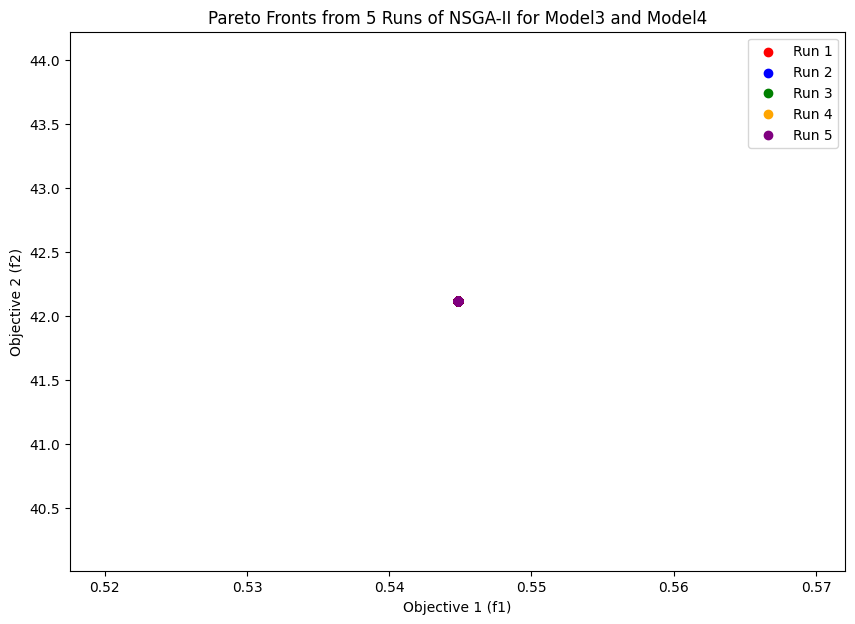

In [ ]:
# Extract the initial values from row 14 for columns X1-X50
initial_values = data.iloc[13, 2:52].values  # Extracting X1-X50 from row 14

# Define the optimization problem
class F1F2Problem(Problem):
    def __init__(self, model_y1, model_y2, initial_values):
        n_var = 70  # Total number of features
        xl_x1_x50 = initial_values  # Fix X1-X50
        xu_x1_x50 = initial_values  # Fix X1-X50

        # Define the range for X51-X70 (10 to 49)
        xl_x51_x70 = np.full(20, 10)
        xu_x51_x70 = np.full(20, 49)

        # Combine all the variable bounds
        xl = np.concatenate((xl_x1_x50, xl_x51_x70))
        xu = np.concatenate((xu_x1_x50, xu_x51_x70))

        super().__init__(n_var=n_var, n_obj=2, n_constr=0, xl=xl, xu=xu)
        self.model_y1 = model_y1
        self.model_y2 = model_y2

    def _evaluate(self, X, out, *args, **kwargs):
        # Scale the input data
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        # Predict F1 and F2 using the trained models
        f1 = self.model_y1.predict(X_scaled)
        f2 = self.model_y2.predict(X_scaled)
        out["F"] = np.column_stack([f1, f2])

# Create the problem instance for model3 and model4
problem = F1F2Problem(model_y1=model3, model_y2=model4, initial_values=initial_values)

# Define the algorithm with updated parameters
algorithm = NSGA2(
    pop_size=100,  # Population size
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.95, eta=10),  # Crossover probability and eta
    mutation=PolynomialMutation(prob=0.25, eta=25)  # Mutation rate
)

# Set up colors for the different runs
colors = ['red', 'blue', 'green', 'orange', 'purple']

# Set a fixed seed for all runs to make them identical
fixed_seed = 42

# Create a figure for the combined plot
plt.figure(figsize=(10, 7))

# Loop to run the optimization 5 times and plot the Pareto fronts in different colors
for i in range(5):
    # Execute the optimization with the fixed seed
    res = minimize(problem, algorithm, ('n_gen', 100), seed=fixed_seed + i, save_history=True, verbose=True)

    # Plot the Pareto Frontier for this run in a different color
    plt.scatter(res.F[:, 0], res.F[:, 1], color=colors[i], label=f'Run {i+1}')

# Calculate the min and max values for f1 and f2 across all runs
f1_min, f1_max = res.F[:, 0].min(), res.F[:, 0].max()
f2_min, f2_max = res.F[:, 1].min(), res.F[:, 1].max()

# Add some padding for better visualization
f1_range = f1_max - f1_min
f2_range = f2_max - f2_min

plt.xlim(f1_min - 0.05 * f1_range, f1_max + 0.05 * f1_range)  # Set the range for f1 on the x-axis
plt.ylim(f2_min - 0.05 * f2_range, f2_max + 0.05 * f2_range)  # Set the range for f2 on the y-axis

# Add labels and legend
plt.xlabel('Objective 1 (f1)')
plt.ylabel('Objective 2 (f2)')
plt.title('Pareto Fronts from 5 Runs of NSGA-II for Model3 and Model4')
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Prepare the data for y1:64/32:0.019(PCA:0.022); 32:0.022; 128/64/32:0.031;
# MLP Prepare the data for y1
X = data.drop(columns=['y1', 'y2'])
y1 = data[['y1']]

# Split the data into training and testing sets for y1
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the MLP model for y1 (model5)
model5 = Sequential()
model5.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model5.add(Dropout(0.2))
model5.add(Dense(32, activation='relu'))
model5.add(Dense(1, activation='linear'))  # One output node for y1

# Compile the model
model5.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stopping_y1 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model and measure time
start_time_model5 = time.time()
history5 = model5.fit(X_train_scaled, y1_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[early_stopping_y1])
end_time_model5 = time.time()

# Evaluate the model
test_loss_model5 = model5.evaluate(X_test_scaled, y1_test)
print(f"Test MSE for y1 (model5): {test_loss_model5}")

# Predict on test data
y1_pred = model5.predict(X_test_scaled)

train_time_model5 = end_time_model5 - start_time_model5
print(f"Training time for y1 model (model5): {train_time_model5} seconds")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 0.0604 - val_loss: 0.0274
Epoch 2/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 0.0283 - val_loss: 0.0227
Epoch 3/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 0.0238 - val_loss: 0.0282
Epoch 4/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 0.0220 - val_loss: 0.0234
Epoch 5/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step - loss: 0.0212 - val_loss: 0.0274
Epoch 6/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - loss: 0.0207 - val_loss: 0.0237
Epoch 7/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step - loss: 0.0200 - val_loss: 0.0281
Epoch 8/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0197 - val_loss: 0.0254
Epoch 9/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 20s 2ms/step - loss: 0.0197 - val_loss: 0.0231
Epoch 10/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.0194 - val_loss: 0.0241
Epoch 11/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 0.0192 - val_loss: 0.0214
Epoch 12/1

In [ ]:
import plotly.graph_objects as go

def plot_actual_vs_predicted_y1(y_true, y_pred, title):
    fig = go.Figure()

    # Actual vs. Predicted for y1
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true.flatten(),
            y=y_pred.flatten(),
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    fig.add_trace(
        go.Scatter(
            x=[0, 3],
            y=[0, 3],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title="Actual y1",
        yaxis_title="Predicted y1",
        width=700,
        height=500,
        xaxis=dict(range=[0, 3]),
        yaxis=dict(range=[0, 3])
    )

    # Show plot
    fig.show()

# Plot for model5 (y1)
plot_actual_vs_predicted_y1(y1_test.values, y1_pred, "Actual vs Predicted y1 Values (Model5)")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#5times or around to trade-off 100，000：6.29；200，000：3.99;500,000:5.01
#test set; unseen data (userbility)
# Prepare the data for y2
X = data.drop(columns=['y1', 'y2'])
y2 = data[['y2']]

# Split the data into training and testing sets for y2
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=42)

# Standardize the data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the MLP model for y2 (model6)
model6 = Sequential()
model6.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model6.add(Dropout(0.2))
model6.add(Dense(32, activation='relu'))
model6.add(Dense(1, activation='linear'))  # One output node for y2

# Compile the model
model6.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Early stopping to prevent overfitting
early_stopping_y2 = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model and measure time
start_time_model6 = time.time()
history6 = model6.fit(X_train_scaled, y2_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1, callbacks=[early_stopping_y2])
end_time_model6 = time.time()

# Evaluate the model
test_loss_model6 = model6.evaluate(X_test_scaled, y2_test)
print(f"Test MSE for y2 (model6): {test_loss_model6}")

# Predict on test data
y2_pred = model6.predict(X_test_scaled)

train_time_model6 = end_time_model6 - start_time_model6
print(f"Training time for y2 model (model6): {train_time_model6} seconds")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 76.6063 - val_loss: 19.1111
Epoch 2/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 21.1277 - val_loss: 18.0904
Epoch 3/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 19.4138 - val_loss: 18.0521
Epoch 4/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 2ms/step - loss: 18.7627 - val_loss: 18.3672
Epoch 5/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 18.5076 - val_loss: 18.2050
Epoch 6/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 17.9042 - val_loss: 16.2777
Epoch 7/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 15.7386 - val_loss: 12.2351
Epoch 8/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 13.1424 - val_loss: 9.3948
Epoch 9/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 18s 2ms/step - loss: 11.0394 - val_loss: 7.3271
Epoch 10/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 9.3708 - val_loss: 6.1830
Epoch 11/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - loss: 8.2156 - val_loss: 6.

In [ ]:
def plot_actual_vs_predicted_y2(y_true, y_pred, title):
    fig = go.Figure()

    # Actual vs. Predicted for y2
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true.flatten(),
            y=y_pred.flatten(),
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],  # Adjusted x-axis range based on realistic range
            y=[min_value, max_value],  # Adjusted y-axis range based on realistic range
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title="Actual y2",
        yaxis_title="Predicted y2",
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),  # Adjusted x-axis range
        yaxis=dict(range=[min_value, max_value])   # Adjusted y-axis range
    )

    # Show plot
    fig.show()

# Plot for model6 (y2)
plot_actual_vs_predicted_y2(y2_test.values, y2_pred, "Actual vs Predicted y2 Values (Model6)")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      8 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |     12 |  0.0351065467 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |     12 |  0.0052523727 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     4 |      400 |      9 |  0.0563836164 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     12 |  0.0355487827 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     6 |      600 |     13 |  0.0478494179 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     7 |      700 |     10 |  0.0963997536 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |      6 |  0.1230379151 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     9 |      900 |      6 |  0.0265846641 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    10 |     1000 |     11 |  0.0231256611 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    11 |     1100 |     13 |  0.0182421983 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    12 |     1200 |      9 |  0.0390403521 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    13 |     1300 |     13 |  0.0420150766 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    14 |     1400 |     18 |  0.0448121438 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    15 |     1500 |     16 |  0.0060891137 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    16 |     1600 |     17 |  0.0297849998 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    17 |     1700 |     18 |  0.0103389898 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     17 |  0.0065182694 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    19 |     1900 |     19 |  0.0429033004 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |     25 |  0.0191023388 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    21 |     2100 |     29 |  0.0231178717 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    22 |     2200 |     33 |  0.0046694948 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    23 |     2300 |     32 |  0.0098297129 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    24 |     2400 |     37 |  0.0047477278 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    25 |     2500 |     38 |  0.0058638431 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    26 |     2600 |     40 |  0.0066257086 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    27 |     2700 |     41 |  0.0067825336 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     36 |  0.0043128660 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    29 |     2900 |     36 |  0.0304747233 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    30 |     3000 |     38 |  0.0088209141 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     33 |  0.0065794219 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    32 |     3200 |     36 |  0.0037864037 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    33 |     3300 |     39 |  0.0143023064 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    34 |     3400 |     39 |  0.0040345533 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    35 |     3500 |     42 |  0.0032345472 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    36 |     3600 |     47 |  0.0127571349 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    37 |     3700 |     47 |  0.0036700937 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |     56 |  0.0069999190 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    39 |     3900 |     51 |  0.0027587790 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |     54 |  0.0021040474 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     55 |  0.0048986371 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    42 |     4200 |     53 |  0.0017750049 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     56 |  0.0042404666 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    44 |     4400 |     52 |  0.0013455406 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    45 |     4500 |     56 |  0.0041143946 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    46 |     4600 |     61 |  0.0014591368 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    47 |     4700 |     61 |  0.0084164980 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    48 |     4800 |     67 |  0.0038006247 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |     68 |  0.0018426459 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    50 |     5000 |     73 |  0.0030084255 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    51 |     5100 |     69 |  0.0025129251 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    52 |     5200 |     70 |  0.0015118156 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    53 |     5300 |     72 |  0.0031640894 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    54 |     5400 |     73 |  0.0029726176 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    55 |     5500 |     74 |  0.0006820336 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    56 |     5600 |     79 |  0.0017204652 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    57 |     5700 |     80 |  0.0030558305 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |     81 |  0.0096914029 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    59 |     5900 |     80 |  0.0018238284 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    60 |     6000 |     79 |  0.0065935324 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    61 |     6100 |     82 |  0.0296027407 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    62 |     6200 |     80 |  0.0010531942 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    63 |     6300 |     85 |  0.0032176441 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    64 |     6400 |     90 |  0.0003038315 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    65 |     6500 |     88 |  0.0017500312 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     91 |  0.0028193362 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    67 |     6700 |    100 |  0.0037077966 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    68 |     6800 |    100 |  0.0007711408 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    69 |     6900 |    100 |  0.0019963414 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    70 |     7000 |     99 |  0.0029028852 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    71 |     7100 |    100 |  0.0070149804 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    72 |     7200 |     96 |  0.0020185788 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    73 |     7300 |     94 |  0.0033922945 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    74 |     7400 |     97 |  0.0005675440 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    75 |     7500 |     96 |  0.0016604963 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    76 |     7600 |     98 |  0.0030490576 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    77 |     7700 |     94 |  0.0008070233 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    78 |     7800 |     95 |  0.0018352276 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    79 |     7900 |     98 |  0.0025520725 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    80 |     8000 |     92 |  0.0250333659 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    81 |     8100 |     97 |  0.0004611910 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |     99 |  0.0012482838 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    83 |     8300 |    100 |  0.0016564488 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    84 |     8400 |    100 |  0.0049345863 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    85 |     8500 |    100 |  0.0475804112 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    86 |     8600 |    100 |  0.0005086470 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    87 |     8700 |    100 |  0.0011128582 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    88 |     8800 |    100 |  0.0014059221 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    89 |     8900 |    100 |  0.0017785259 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |    100 |  0.0022936958 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    91 |     9100 |    100 |  0.0026476990 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    92 |     9200 |    100 |  0.0007188354 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    93 |     9300 |    100 |  0.0020536777 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    94 |     9400 |    100 |  0.0026896391 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    95 |     9500 |    100 |  0.0009512251 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    96 |     9600 |     99 |  0.0016891577 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    97 |     9700 |     97 |  0.0250534417 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    98 |     9800 |    100 |  0.0005196840 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    99 |     9900 |    100 |  0.0028227365 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



   100 |    10000 |    100 |  0.0010584893 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      7 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     2 |      200 |      9 |  0.1730863961 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     3 |      300 |      6 |  0.4931250702 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     4 |      400 |      9 |  0.0045295375 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     5 |      500 |      6 |  0.0561809846 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     6 |      600 |      8 |  0.0206777328 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     7 |      700 |      8 |  0.3684802578 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     8 |      800 |     11 |  0.0342682195 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     9 |      900 |     15 |  0.0169320266 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    10 |     1000 |     19 |  0.0304578308 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     21 |  0.0147761769 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    12 |     1200 |     18 |  0.0162118331 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    13 |     1300 |     21 |  0.0534831541 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    14 |     1400 |     19 |  0.0236344228 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     19 |  0.0142410463 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    16 |     1600 |     17 |  0.0208107107 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    17 |     1700 |     19 |  0.0255127953 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    18 |     1800 |     26 |  0.0182195145 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    19 |     1900 |     22 |  0.0159830614 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |     18 |  0.0163380191 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    21 |     2100 |     19 |  0.0116871206 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    22 |     2200 |     21 |  0.0515110091 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    23 |     2300 |     22 |  0.0106007050 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     29 |  0.0080367930 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    25 |     2500 |     27 |  0.0128072276 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     24 |  0.0075874953 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    27 |     2700 |     30 |  0.0074493473 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     37 |  0.0039802601 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |     35 |  0.1394406877 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    30 |     3000 |     35 |  0.0267716201 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    31 |     3100 |     40 |  0.0042761816 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
    32 |     3200 |     47 |  0.0012726465 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    33 |     3300 |     46 |  0.0038812588 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    34 |     3400 |     49 |  0.0051057511 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    35 |     3500 |     37 |  0.0041172749 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    36 |     3600 |     39 |  0.0055543094 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    37 |     3700 |     42 |  0.0025078793 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |     42 |  0.0060611230 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    39 |     3900 |     39 |  0.0471946385 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |     35 |  0.0021142212 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    41 |     4100 |     36 |  0.0049611581 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    42 |     4200 |     41 |  0.0025806561 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    43 |     4300 |     43 |  0.0037641374 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    44 |     4400 |     43 |  0.0018066695 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    45 |     4500 |     43 |  0.0156014224 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    46 |     4600 |     50 |  0.0023602453 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    47 |     4700 |     52 |  0.0037675454 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     54 |  0.0018018624 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    49 |     4900 |     57 |  0.0034737571 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    50 |     5000 |     55 |  0.0062228207 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    51 |     5100 |     54 |  0.0012191351 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    52 |     5200 |     52 |  0.0025365108 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    53 |     5300 |     55 |  0.0069849197 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    54 |     5400 |     60 |  0.0211294223 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    55 |     5500 |     63 |  0.0010559266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    56 |     5600 |     66 |  0.0059853233 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    57 |     5700 |     70 |  0.0002312528 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |     81 |  0.0009448246 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    59 |     5900 |     83 |  0.0013184455 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    60 |     6000 |     88 |  0.0015900028 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    61 |     6100 |     98 |  0.0061764017 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    62 |     6200 |     98 |  0.0008037168 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    63 |     6300 |     84 |  0.0041422922 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    64 |     6400 |     80 |  0.2025083135 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    65 |     6500 |     80 |  0.0012163746 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    66 |     6600 |     79 |  0.0020302829 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |     72 |  0.0030923386 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    68 |     6800 |     72 |  0.0009352226 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    69 |     6900 |     75 |  0.0043442028 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    70 |     7000 |     82 |  0.0010452562 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    71 |     7100 |     82 |  0.0113308833 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    72 |     7200 |     83 |  0.0004644126 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    73 |     7300 |     88 |  0.0009326158 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     95 |  0.0019830928 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    75 |     7500 |    100 |  0.0050352715 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    76 |     7600 |     97 |  0.0033202354 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    77 |     7700 |     97 |  0.0007304788 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    78 |     7800 |    100 |  0.0107793031 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    79 |     7900 |    100 |  0.0034541124 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    80 |     8000 |     99 |  0.0004261923 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    81 |     8100 |     95 |  0.0011739628 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
    82 |     8200 |     92 |  0.0016593087 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    83 |     8300 |     98 |  0.0022859258 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |    100 |  0.0025082967 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    85 |     8500 |     94 |  0.0009148810 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    86 |     8600 |     94 |  0.0055494559 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    87 |     8700 |     93 |  0.0029269126 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |     93 |  0.0002973881 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    89 |     8900 |     93 |  0.0008951104 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     96 |  0.0015813106 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     93 |  0.0104605311 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    92 |     9200 |     99 |  0.0006510619 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |    100 |  0.0009884357 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |    100 |  0.0071388053 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    95 |     9500 |    100 |  0.0059138656 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |    100 |  0.0003366503 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |    100 |  0.0007057450 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    98 |     9800 |    100 |  0.0009411953 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |     97 |  0.0023613627 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



   100 |    10000 |     98 |  0.0027096489 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      6 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     2 |      200 |      7 |  0.2240563597 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |      7 |  0.1811618494 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     4 |      400 |     11 |  0.1840413283 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |      8 |  0.0720505697 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     6 |      600 |      8 |  0.1847445734 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     7 |      700 |     12 |  0.0045028682 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     8 |      800 |     16 |  0.0771339640 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     9 |      900 |     12 |  0.0238843046 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    10 |     1000 |     15 |  0.0398518081 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     18 |  0.0065470974 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    12 |     1200 |     16 |  0.0223210253 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    13 |     1300 |     15 |  0.0160664854 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    14 |     1400 |     13 |  0.0143182470 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    15 |     1500 |     13 |  0.0195010233 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    16 |     1600 |     15 |  0.0016979320 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    17 |     1700 |      9 |  0.0369961321 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     12 |  0.0027858426 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    19 |     1900 |     12 |  0.0077330636 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    20 |     2000 |     17 |  0.0089187938 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    21 |     2100 |     20 |  0.0228000916 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    22 |     2200 |     26 |  0.0296878247 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    23 |     2300 |     22 |  0.0042755924 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    24 |     2400 |     21 |  0.0116042953 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    25 |     2500 |     21 |  0.000000E+00 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     25 |  0.0101927326 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    27 |     2700 |     27 |  0.0090199787 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    28 |     2800 |     27 |  0.1085940239 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    29 |     2900 |     26 |  0.0135146560 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    30 |     3000 |     25 |  0.0101491069 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    31 |     3100 |     29 |  0.0127048640 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    32 |     3200 |     34 |  0.0029521563 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    33 |     3300 |     41 |  0.0179916426 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    34 |     3400 |     43 |  0.0035307101 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    35 |     3500 |     38 |  0.0045258084 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    36 |     3600 |     35 |  0.0812987104 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    37 |     3700 |     35 |  0.0020864396 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    38 |     3800 |     36 |  0.0080677230 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    39 |     3900 |     32 |  0.0136076830 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    40 |     4000 |     37 |  0.0039325734 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    41 |     4100 |     39 |  0.0010705367 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    42 |     4200 |     41 |  0.0028619356 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     41 |  0.0056159969 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     42 |  0.0075394379 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    45 |     4500 |     37 |  0.0180030702 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    46 |     4600 |     42 |  0.0274418241 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    47 |     4700 |     43 |  0.0031156984 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    48 |     4800 |     40 |  0.0105316762 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    49 |     4900 |     41 |  0.0044103908 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    50 |     5000 |     47 |  0.0028490099 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    51 |     5100 |     36 |  0.0020951801 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     41 |  0.0035496753 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    53 |     5300 |     43 |  0.0191862469 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    54 |     5400 |     42 |  0.0024626544 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    55 |     5500 |     44 |  0.0053811207 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    56 |     5600 |     42 |  0.0040664422 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    57 |     5700 |     47 |  0.0021768723 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     48 |  0.0034629301 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    59 |     5900 |     49 |  0.0006077705 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    60 |     6000 |     51 |  0.1975583200 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    61 |     6100 |     54 |  0.0048157678 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     52 |  0.0166254748 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     53 |  0.0180461771 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |     52 |  0.0205354971 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    65 |     6500 |     54 |  0.0009577266 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    66 |     6600 |     54 |  0.0020082490 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    67 |     6700 |     49 |  0.0033290502 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     53 |  0.0025609818 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    69 |     6900 |     60 |  0.0011653139 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    70 |     7000 |     63 |  0.0032293989 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    71 |     7100 |     66 |  0.0026315655 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    72 |     7200 |     63 |  0.0007358843 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    73 |     7300 |     70 |  0.0016248410 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    74 |     7400 |     70 |  0.0030813957 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     63 |  0.0019630236 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    76 |     7600 |     65 |  0.0107960579 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    77 |     7700 |     65 |  0.0009628319 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    78 |     7800 |     68 |  0.0072283293 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    79 |     7900 |     62 |  0.0008786298 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    80 |     8000 |     65 |  0.0343779974 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    81 |     8100 |     66 |  0.0002757128 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |     68 |  0.0080257982 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    83 |     8300 |     70 |  0.0006987296 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    84 |     8400 |     74 |  0.0012785230 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    85 |     8500 |     71 |  0.0018818993 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    86 |     8600 |     65 |  0.0028761444 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    87 |     8700 |     55 |  0.0015267112 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |     61 |  0.0043186292 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    89 |     8900 |     61 |  0.0001932372 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |     67 |  0.0012648528 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    91 |     9100 |     68 |  0.0012546804 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    92 |     9200 |     69 |  0.0025141874 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |     63 |  0.0010506148 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |     64 |  0.0020261843 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    95 |     9500 |     70 |  0.0026546072 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |     70 |  0.0005888936 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    97 |     9700 |     70 |  0.0008949634 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     73 |  0.0150790817 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    99 |     9900 |     75 |  0.0087465316 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
   100 |    10000 |     80 |  0.0010782625 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      3 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |      8 |  0.2442916138 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |      7 |  0.0960556673 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
     4 |      400 |     10 |  0.2219509563 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     11 |  0.0231951110 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     6 |      600 |     13 |  0.0800469524 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     7 |      700 |     12 |  0.0136660614 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     8 |      800 |     17 |  0.0421972165 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



     9 |      900 |     15 |  0.0788878809 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    10 |     1000 |     20 |  0.0574489991 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    11 |     1100 |     20 |  0.0069015373 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    12 |     1200 |     18 |  0.0177021668 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    13 |     1300 |     11 |  0.0838240357 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    14 |     1400 |     17 |  0.0208121029 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    15 |     1500 |     18 |  0.0272551636 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     19 |  0.0038602297 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    17 |     1700 |     19 |  0.0136534139 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    18 |     1800 |     23 |  0.0105546711 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    19 |     1900 |     30 |  0.1537621797 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    20 |     2000 |     37 |  0.0072681552 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    21 |     2100 |     35 |  0.0076027649 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    22 |     2200 |     32 |  0.0068519021 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     28 |  0.0094750997 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    24 |     2400 |     33 |  0.0350945154 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    25 |     2500 |     30 |  0.0045784811 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     24 |  0.0093018716 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    27 |     2700 |     20 |  0.0558631084 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    28 |     2800 |     19 |  0.0058082418 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    29 |     2900 |     20 |  0.0058588189 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    30 |     3000 |     32 |  0.0108261171 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    31 |     3100 |     42 |  0.0050134641 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    32 |     3200 |     37 |  0.0370278875 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     37 |  0.0038111140 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    34 |     3400 |     37 |  0.0045391663 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    35 |     3500 |     37 |  0.0088802658 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    36 |     3600 |     39 |  0.0052927342 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    37 |     3700 |     44 |  0.0038789415 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |     48 |  0.0427855684 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    39 |     3900 |     54 |  0.0026785057 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |     47 |  0.0027753171 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     58 |  0.0167783996 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    42 |     4200 |     57 |  0.0044620804 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    43 |     4300 |     53 |  0.0240658538 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     54 |  0.0142920754 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     54 |  0.0101367732 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    46 |     4600 |     47 |  0.0074453624 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    47 |     4700 |     45 |  0.0217726260 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     47 |  0.0019556929 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    49 |     4900 |     48 |  0.0065818093 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    50 |     5000 |     48 |  0.0035095867 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    51 |     5100 |     52 |  0.0030248725 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     54 |  0.0061495386 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    53 |     5300 |     57 |  0.0014981021 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     60 |  0.0026000232 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     61 |  0.0021925362 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    56 |     5600 |     60 |  0.0030373304 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    57 |     5700 |     62 |  0.0015575581 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    58 |     5800 |     62 |  0.0040516045 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    59 |     5900 |     59 |  0.0027060125 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    60 |     6000 |     62 |  0.0019984446 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    61 |     6100 |     63 |  0.0030645473 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     62 |  0.0126195792 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    63 |     6300 |     65 |  0.0009337805 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    64 |     6400 |     65 |  0.0045123160 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    65 |     6500 |     68 |  0.0004444041 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     66 |  0.0027599843 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |     72 |  0.0241895806 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    68 |     6800 |     76 |  0.0020193081 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    69 |     6900 |     75 |  0.0025702542 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    70 |     7000 |     79 |  0.0047165063 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    71 |     7100 |     81 |  0.0002557712 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    72 |     7200 |     74 |  0.0017307347 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    73 |     7300 |     71 |  0.0032059683 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    74 |     7400 |     69 |  0.0010985569 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    75 |     7500 |     61 |  0.0024390026 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    76 |     7600 |     68 |  0.0089143186 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    77 |     7700 |     71 |  0.0012289195 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    78 |     7800 |     74 |  0.0023083621 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    79 |     7900 |     79 |  0.0033715797 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    80 |     8000 |     77 |  0.0014414889 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    81 |     8100 |     80 |  0.0194667852 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    82 |     8200 |     74 |  0.0010304513 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    83 |     8300 |     77 |  0.0012960150 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    84 |     8400 |     80 |  0.0024807158 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    85 |     8500 |     82 |  0.0032488528 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    86 |     8600 |     90 |  0.0012711519 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    87 |     8700 |     98 |  0.0018077890 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    88 |     8800 |    100 |  0.0026827702 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
    89 |     8900 |     99 |  0.0028930039 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    90 |     9000 |    100 |  0.0007893126 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    91 |     9100 |    100 |  0.0011730750 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    92 |     9200 |    100 |  0.0025670504 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |    100 |  0.0002943480 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    94 |     9400 |    100 |  0.0010567611 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    95 |     9500 |     98 |  0.0016602700 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    96 |     9600 |     96 |  0.0025873250 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |    100 |  0.0083425480 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    98 |     9800 |    100 |  0.0008555608 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    99 |     9900 |    100 |  0.0016146972 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
   100 |    10000 |    100 |  0.0025213527 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |      7 |  0.2230240372 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |     12 |  0.0374535480 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     4 |      400 |     16 |  0.1577236906 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     5 |      500 |     17 |  0.0420214039 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     6 |      600 |     15 |  0.0307495254 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     7 |      700 |     13 |  0.0252646408 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     8 |      800 |     17 |  0.0585401496 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



     9 |      900 |     16 |  0.0166034814 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    10 |     1000 |     14 |  0.0533281757 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    11 |     1100 |     14 |  0.5913908560 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    12 |     1200 |     15 |  0.0539751130 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    13 |     1300 |     15 |  0.0131946536 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    14 |     1400 |     20 |  0.0197188390 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    15 |     1500 |     24 |  0.0083801946 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    16 |     1600 |     24 |  0.0334793437 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    17 |     1700 |     20 |  0.0106686705 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     23 |  0.0021957952 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    19 |     1900 |     30 |  0.0158536396 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    20 |     2000 |     27 |  0.0239069202 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    21 |     2100 |     24 |  0.0105082501 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    22 |     2200 |     24 |  0.0426821271 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     27 |  0.0209562787 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    24 |     2400 |     30 |  0.0051523618 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    25 |     2500 |     17 |  0.0082707412 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    26 |     2600 |     18 |  0.0143292497 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    27 |     2700 |     21 |  0.0344243440 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    28 |     2800 |     19 |  0.0039066858 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    29 |     2900 |     20 |  0.0075177297 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    30 |     3000 |     24 |  0.0040561983 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     28 |  0.0048380375 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    32 |     3200 |     29 |  0.0030456555 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     32 |  0.0029056906 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    34 |     3400 |     35 |  0.0078619622 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    35 |     3500 |     34 |  0.0067578463 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    36 |     3600 |     42 |  0.0027893046 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    37 |     3700 |     45 |  0.0329149883 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    38 |     3800 |     43 |  0.0040123955 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    39 |     3900 |     38 |  0.0059136552 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    40 |     4000 |     40 |  0.0252976637 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    41 |     4100 |     40 |  0.0086905870 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    42 |     4200 |     38 |  0.0034321944 |             f


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    43 |     4300 |     40 |  0.0024672604 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    44 |     4400 |     42 |  0.0053841315 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    45 |     4500 |     45 |  0.0202166653 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    46 |     4600 |     46 |  0.0267002587 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    47 |     4700 |     44 |  0.0010459884 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    48 |     4800 |     46 |  0.0037056266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    49 |     4900 |     46 |  0.0354430023 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    50 |     5000 |     49 |  0.0045813503 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    51 |     5100 |     50 |  0.0029162261 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    52 |     5200 |     49 |  0.0020315504 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    53 |     5300 |     52 |  0.0039837743 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     45 |  0.0017183119 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    55 |     5500 |     44 |  0.0034701835 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    56 |     5600 |     41 |  0.0042171331 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    57 |     5700 |     41 |  0.0054168066 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    58 |     5800 |     48 |  0.0097765322 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    59 |     5900 |     51 |  0.0039774183 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    60 |     6000 |     53 |  0.0027533801 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    61 |     6100 |     55 |  0.0009886615 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    62 |     6200 |     55 |  0.0022463210 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     54 |  0.0106894147 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    64 |     6400 |     53 |  0.0090607581 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    65 |     6500 |     55 |  0.0002710046 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    66 |     6600 |     57 |  0.0058139326 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    67 |     6700 |     61 |  0.0028566132 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     58 |  0.0065437085 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    69 |     6900 |     56 |  0.0026412278 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    70 |     7000 |     59 |  0.0004298704 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    71 |     7100 |     61 |  0.0010666774 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    72 |     7200 |     63 |  0.0018582631 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    73 |     7300 |     59 |  0.1035539870 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     61 |  0.0137123812 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     61 |  0.0008938095 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    76 |     7600 |     64 |  0.0013214081 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    77 |     7700 |     68 |  0.0028848593 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    78 |     7800 |     62 |  0.0019393706 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    79 |     7900 |     65 |  0.0042619537 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    80 |     8000 |     61 |  0.0011327162 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    81 |     8100 |     66 |  0.0033570831 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     66 |  0.0013377173 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    83 |     8300 |     67 |  0.0034907600 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |     69 |  0.0020802949 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     61 |  0.0039554327 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    86 |     8600 |     66 |  0.0007002768 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    87 |     8700 |     65 |  0.0023663944 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    88 |     8800 |     70 |  0.0967173984 |         nadir
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    89 |     8900 |     70 |  0.0006995272 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    90 |     9000 |     75 |  0.0018906504 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    91 |     9100 |     67 |  0.0027048338 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    92 |     9200 |     65 |  0.0031243757 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    93 |     9300 |     68 |  0.0009961838 |             f
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    94 |     9400 |     73 |  0.0209040817 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



    95 |     9500 |     73 |  0.0016679519 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    96 |     9600 |     79 |  0.0073249097 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    97 |     9700 |     84 |  0.0064250913 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



    98 |     9800 |     85 |  0.0054711972 |         ideal
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    99 |     9900 |     84 |  0.0004202855 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
   100 |    10000 |     79 |  0.0137286580 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning:

The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated



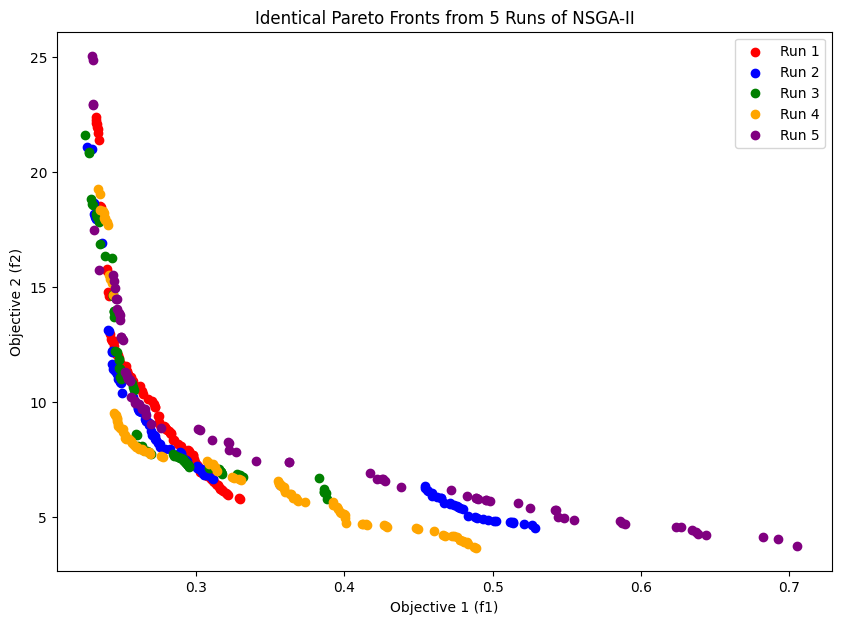

In [ ]:
# Extract the initial values from row 14 for columns X1-X50
initial_values = data.iloc[13, 2:52].values  # Extracting X1-X50 from row 14

# Define the optimization problem
class F1F2Problem(Problem):
    def __init__(self, model_y1, model_y2, initial_values):
        n_var = 70  # Total number of features
        xl_x1_x50 = initial_values  # Fix X1-X50
        xu_x1_x50 = initial_values  # Fix X1-X50

        # Define the range for X51-X70 (10 to 49)
        xl_x51_x70 = np.full(20, 10)
        xu_x51_x70 = np.full(20, 49)

        # Combine all the variable bounds
        xl = np.concatenate((xl_x1_x50, xl_x51_x70))
        xu = np.concatenate((xu_x1_x50, xu_x51_x70))

        super().__init__(n_var=n_var, n_obj=2, n_constr=0, xl=xl, xu=xu)
        self.model_y1 = model_y1
        self.model_y2 = model_y2

    def _evaluate(self, X, out, *args, **kwargs):
        # Scale the input data
        X_scaled = scaler.transform(X)
        # Predict F1 and F2 using the trained MLP models
        f1 = self.model_y1.predict(X_scaled)
        f2 = self.model_y2.predict(X_scaled)
        out["F"] = np.column_stack([f1, f2])

# Create the problem instance
problem = F1F2Problem(model_y1=model5, model_y2=model6, initial_values=initial_values)

# Define the algorithm with updated parameters
algorithm = NSGA2(
    pop_size=100,  # Increased population size
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.95, eta=10),  # Increased crossover probability and decreased eta
    mutation=PolynomialMutation(prob=0.25, eta=25)  # Increased mutation rate
)

# Set up colors for the different runs
colors = ['red', 'blue', 'green', 'orange', 'purple']

# Set a fixed seed for all runs to make them identical
fixed_seed = 42

# Create a figure for the combined plot
plt.figure(figsize=(10, 7))

# Loop to run the optimization 5 times and plot the Pareto fronts in different colors
for i in range(5):
    # Execute the optimization with the fixed seed
    res = minimize(problem, algorithm, ('n_gen', 100), seed=fixed_seed+i, save_history=True, verbose=True)

    # Plot the Pareto Frontier for this run in a different color
    plt.scatter(res.F[:, 0], res.F[:, 1], color=colors[i], label=f'Run {i+1}')

# Calculate the min and max values for f1 and f2 across all runs
f1_min, f1_max = res.F[:, 0].min(), res.F[:, 0].max()
f2_min, f2_max = res.F[:, 1].min(), res.F[:, 1].max()

# Add some padding for better visualization
f1_range = f1_max - f1_min
f2_range = f2_max - f2_min

plt.xlim(f1_min - 0.05 * f1_range, f1_max + 0.05 * f1_range)  # Set the range for f1 on the x-axis
plt.ylim(f2_min - 0.05 * f2_range, f2_max + 0.05 * f2_range)  # Set the range for f2 on the y-axis

# Add labels and legend
plt.xlabel('Objective 1 (f1)')
plt.ylabel('Objective 2 (f2)')
plt.title('Identical Pareto Fronts from 5 Runs of NSGA-II')
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Model7 for y1
# Prepare the data for model7 (y1)
X = data.drop(columns=['y1', 'y2']).values
y1 = data['y1'].values

# Reshape X to be 3D as required by LSTM (samples, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Split the data into training and testing sets for y1
X_train, X_test, y1_train, y1_test = train_test_split(X, y1, test_size=0.2, random_state=42)

# Standardize data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

# Construct the LSTM model for y1 (model7)
model7 = Sequential()
model7.add(LSTM(64, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2]), activation='relu'))
model7.add(Dropout(0.2))
model7.add(Dense(1, activation='linear'))

# Compile the model
model7.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model and measure time
start_time_model7 = time.time()
history7 = model7.fit(X_train_scaled, y1_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)
end_time_model7 = time.time()

# Calculate training time
train_time_model7 = end_time_model7 - start_time_model7
print(f"Training time for y1 model (model7): {train_time_model7} seconds")

# Evaluate the model on the test set
test_loss_model7 = model7.evaluate(X_test_scaled, y1_test)
print(f"Test MSE for model7 (y1): {test_loss_model7}")

# Predict on the test set
y1_pred_model7 = model7.predict(X_test_scaled)

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 0.0546 - val_loss: 0.0273
Epoch 2/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 0.0302 - val_loss: 0.0262
Epoch 3/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - loss: 0.0270 - val_loss: 0.0227
Epoch 4/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 27s 5ms/step - loss: 0.0255 - val_loss: 0.0212
Epoch 5/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.0245 - val_loss: 0.0207
Epoch 6/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - loss: 0.0234 - val_loss: 0.0206
Epoch 7/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step - loss: 0.0229 - val_loss: 0.0198
Epoch 8/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 2ms/step - loss: 0.0223 - val_loss: 0.0195
Epoch 9/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.0222 - val_loss: 0.0186
Epoch 10/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - loss: 0.0217 - val_loss: 0.0191
Epoch 11/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.0214 - val_loss: 0.0189
Epoch 12/

In [ ]:
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred.flatten(),  # Flattening y_pred to match y_true
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot the predicted vs actual values for y1 (Model7)
plot_actual_vs_predicted(y1_test, y1_pred, "Actual vs Predicted y1 Values (Model7)", "Actual y1", "Predicted y1")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Model8 for y2
# Prepare the data for model8 (y2)
X = data.drop(columns=['y1', 'y2']).values
y2 = data['y2'].values

# Reshape X to be 3D as required by LSTM (samples, timesteps, features)
X = X.reshape((X.shape[0], 1, X.shape[1]))

# Split the data into training and testing sets for y2
X_train, X_test, y2_train, y2_test = train_test_split(X, y2, test_size=0.2, random_state=42)

# Standardize data
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

# Construct the LSTM model for y2 (model8)
model8 = Sequential()
model8.add(LSTM(64, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2]), activation='relu'))
model8.add(Dropout(0.2))
model8.add(Dense(1, activation='linear'))

# Compile the model
model8.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model and measure time
start_time_model8 = time.time()
history8 = model8.fit(X_train_scaled, y2_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)
end_time_model8 = time.time()

# Calculate training time
train_time_model8 = end_time_model8 - start_time_model8
print(f"Training time for y2 model (model8): {train_time_model8} seconds")

# Evaluate the model on the test set
test_loss_model8 = model8.evaluate(X_test_scaled, y2_test)
print(f"Test MSE for model8 (y2): {test_loss_model8}")

# Predict on the test set
y2_pred_model8 = model8.predict(X_test_scaled)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 135.6466 - val_loss: 20.3221
Epoch 2/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 25.5014 - val_loss: 12.2715
Epoch 3/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 16.9258 - val_loss: 7.3040
Epoch 4/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - loss: 12.0864 - val_loss: 5.2045
Epoch 5/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - loss: 9.2420 - val_loss: 3.8360
Epoch 6/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 7.8506 - val_loss: 3.4204
Epoch 7/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 9s 2ms/step - loss: 6.9720 - val_loss: 3.0694
Epoch 8/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 6.4982 - val_loss: 2.8142
Epoch 9/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 6.0298 - val_loss: 3.2673
Epoch 10/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 5.6512 - val_loss: 2.4962
Epoch 11/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 5.3329 - val_loss: 2.4641
Epoch 12/100
40

In [ ]:
# Plot the predicted vs actual values for y2 (Model8)
def plot_actual_vs_predicted(y_true, y_pred, title, xaxis_title, yaxis_title):
    fig = go.Figure()

    # Actual vs. Predicted
    fig.add_trace(
        go.Scatter(
            mode='markers',
            x=y_true,
            y=y_pred.flatten(),  # Flattening y_pred to match y_true
            marker=dict(
                color='rgba(40, 40, 250, 0.3)',
                size=5,
            ),
            name='Actual vs Predicted'
        )
    )

    # Add a 45-degree line to show the perfect prediction
    min_value = min(y_true.min(), y_pred.min())
    max_value = max(y_true.max(), y_pred.max())

    fig.add_trace(
        go.Scatter(
            x=[min_value, max_value],
            y=[min_value, max_value],
            mode='lines',
            line=dict(color='red', dash='dash'),
            showlegend=False,
            name='Perfect Prediction Line'
        )
    )

    # Update layout
    fig.update_layout(
        title=title,
        xaxis_title=xaxis_title,
        yaxis_title=yaxis_title,
        width=700,
        height=500,
        xaxis=dict(range=[min_value, max_value]),
        yaxis=dict(range=[min_value, max_value])
    )

    # Show plot
    fig.show()

# Plot the predicted vs actual values for y2 (Model8)
plot_actual_vs_predicted(y2_test, y2_pred, "Actual vs Predicted y2 Values (Model8)", "Actual y2", "Predicted y2")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
initial_values = data.iloc[13, 2:52].values  # Extracting X1-X50 from row 15
print(initial_values)

[4.79383722 4.76760442 5.10598275 5.57710124 5.62344278 5.20566662
 4.8041072  4.74872685 4.78972932 4.54865315 4.27814871 4.33801007
 4.69335133 5.03250927 5.18008292 5.38977245 5.61465586 5.47497079
 5.02890192 4.71143528 4.71915714 4.67710799 4.35480635 3.97699248
 3.66905481 3.4627315  3.46186114 3.53387825 3.80758702 4.29126845
 4.75275725 5.02600202 5.00526929 4.88749735 4.78640249 4.98260824
 5.43795932 5.72785629 5.62500402 5.29598921 5.07547081 5.15501612
 5.50748877 5.71482286 5.45739655 5.17108373 5.33295944 5.77338022
 6.1494795  6.40354841]


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      5 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     2 |      200 |      9 |  0.0397688984 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |     11 |  0.0471231249 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
     4 |      400 |     13 |  0.0724388585 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     14 |  0.0153244382 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     6 |      600 |     15 |  0.0535904802 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     7 |      700 |     18 |  0.0066812659 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     8 |      800 |     18 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     9 |      900 |     17 |  0.2117189504 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    10 |     1000 |     16 |  0.0085058153 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     17 |  0.0093124748 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    12 |     1200 |     18 |  0.0030358029 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    13 |     1300 |     17 |  0.0068805373 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    14 |     1400 |     15 |  0.0121954957 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     15 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     16 |  0.0062123902 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    17 |     1700 |     18 |  0.0112693562 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    18 |     1800 |     19 |  0.0549240838 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    19 |     1900 |     16 |  0.0033191037 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    20 |     2000 |     17 |  0.0087683732 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    21 |     2100 |     18 |  0.0017500318 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    22 |     2200 |     19 |  0.0097304517 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     19 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     20 |  0.0009036213 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    25 |     2500 |     20 |  0.0009036213 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    26 |     2600 |     21 |  0.0021118209 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    27 |     2700 |     20 |  0.0103852340 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     19 |  0.0029467933 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    29 |     2900 |     16 |  0.0248413290 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    30 |     3000 |     11 |  0.0139556244 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    31 |     3100 |     11 |  0.0079414418 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    32 |     3200 |     11 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     12 |  0.0300454824 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    34 |     3400 |     12 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    35 |     3500 |     12 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    36 |     3600 |     14 |  0.0060510733 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    37 |     3700 |     14 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    38 |     3800 |     15 |  0.0029920273 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    39 |     3900 |     15 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    40 |     4000 |     16 |  0.0003347598 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     17 |  0.0012238715 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    42 |     4200 |     16 |  0.0022577464 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     16 |  0.0022577464 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     16 |  0.0022577464 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     17 |  0.0049973613 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    46 |     4600 |     18 |  0.0054294693 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    47 |     4700 |     18 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     19 |  0.0147470665 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    49 |     4900 |     19 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    50 |     5000 |     20 |  0.0026406054 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    51 |     5100 |     21 |  0.0012721825 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    52 |     5200 |     21 |  0.0012721825 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    53 |     5300 |     21 |  0.0012721825 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     21 |  0.0012721825 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     22 |  0.0019470629 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    56 |     5600 |     23 |  0.0029171299 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    57 |     5700 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    59 |     5900 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    60 |     6000 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    61 |     6100 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    62 |     6200 |     24 |  0.0203102156 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    63 |     6300 |     25 |  0.0013881479 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    64 |     6400 |     24 |  0.0022313893 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    65 |     6500 |     23 |  0.0043060322 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    67 |     6700 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     24 |  0.0006358248 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    69 |     6900 |     23 |  0.0010896402 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    70 |     7000 |     24 |  0.0021035984 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    71 |     7100 |     24 |  0.0021035984 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    72 |     7200 |     25 |  0.0030824329 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    73 |     7300 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    75 |     7500 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    76 |     7600 |     22 |  0.0125231245 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    77 |     7700 |     21 |  0.0271601704 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    78 |     7800 |     24 |  0.0025373078 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    79 |     7900 |     24 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    80 |     8000 |     21 |  0.0027936686 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    81 |     8100 |     21 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     21 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    83 |     8300 |     18 |  0.0027724308 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |     19 |  0.0003850675 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     21 |  0.0032189675 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    86 |     8600 |     23 |  0.0060679616 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    87 |     8700 |     23 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    88 |     8800 |     25 |  0.0025140330 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    89 |     8900 |     25 |  0.0396438097 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    92 |     9200 |     25 |  0.0008545678 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    93 |     9300 |     25 |  0.0008545678 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    94 |     9400 |     24 |  0.0017473894 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    95 |     9500 |     25 |  0.0021448538 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    96 |     9600 |     26 |  0.0029362301 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    97 |     9700 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     26 |  0.0005476853 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    99 |     9900 |     27 |  0.0035755266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
   100 |    10000 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      8 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |     12 |  0.0782131125 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     3 |      300 |     17 |  0.1665036889 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     4 |      400 |     10 |  0.0678965348 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     10 |  0.0285208523 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     6 |      600 |     13 |  0.0172316284 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     7 |      700 |     13 |  0.0317217567 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     8 |      800 |     14 |  0.0258399382 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     9 |      900 |     18 |  0.0236683133 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    10 |     1000 |     20 |  0.0037248905 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    11 |     1100 |     21 |  0.0050637356 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    12 |     1200 |     23 |  0.0114671072 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    13 |     1300 |     22 |  0.0289517226 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    14 |     1400 |     16 |  0.0099575316 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     17 |  0.0044686376 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     17 |  0.0212537775 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    17 |     1700 |     19 |  0.0561222340 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     18 |  0.0028253205 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    19 |     1900 |     20 |  0.0032881551 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    20 |     2000 |     22 |  0.0030225352 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    21 |     2100 |     22 |  0.0024330327 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    22 |     2200 |     22 |  0.0073130904 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     25 |  0.0035468474 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    25 |     2500 |     26 |  0.0006605811 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     25 |  0.0074675377 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    27 |     2700 |     25 |  0.0007861381 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     27 |  0.0020663869 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    29 |     2900 |     28 |  0.0024847159 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    30 |     3000 |     29 |  0.0447548090 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     30 |  0.0007834807 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    32 |     3200 |     26 |  0.0022485735 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     24 |  0.0039873764 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    34 |     3400 |     25 |  0.0000996110 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    35 |     3500 |     25 |  0.0000996110 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    36 |     3600 |     27 |  0.0086797412 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    37 |     3700 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    38 |     3800 |     29 |  0.0018165594 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    39 |     3900 |     30 |  0.0035780970 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    40 |     4000 |     30 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    41 |     4100 |     29 |  0.0017044607 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    42 |     4200 |     27 |  0.0033366946 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     26 |  0.0010203266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     26 |  0.0010203266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    46 |     4600 |     26 |  0.0010203266 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    47 |     4700 |     27 |  0.0017476531 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     28 |  0.0021818028 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    49 |     4900 |     26 |  0.0019607549 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    50 |     5000 |     27 |  0.0045968986 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    51 |     5100 |     25 |  0.0066203583 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     26 |  0.0009232800 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    53 |     5300 |     28 |  0.0053572544 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     29 |  0.0015056396 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     29 |  0.0015056396 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    56 |     5600 |     27 |  0.0020105609 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    57 |     5700 |     24 |  0.0062953744 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     25 |  0.0013579269 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    59 |     5900 |     25 |  0.0029038165 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    60 |     6000 |     25 |  0.0041194441 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    61 |     6100 |     21 |  0.0038240033 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     21 |  0.0017516943 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     22 |  0.0043799746 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    64 |     6400 |     23 |  0.0005152045 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    65 |     6500 |     24 |  0.0043763113 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     24 |  0.0084835784 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    67 |     6700 |     24 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     25 |  0.0035194560 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    69 |     6900 |     27 |  0.0140306034 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    70 |     7000 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    71 |     7100 |     27 |  0.0498575979 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    72 |     7200 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    73 |     7300 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     24 |  0.0020827550 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     25 |  0.0045151357 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    76 |     7600 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    77 |     7700 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    78 |     7800 |     26 |  0.0029862725 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    79 |     7900 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    80 |     8000 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    81 |     8100 |     27 |  0.0000920691 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     27 |  0.0000920691 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    83 |     8300 |     28 |  0.0012411613 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |     29 |  0.0015310565 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     28 |  0.0026301387 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    86 |     8600 |     28 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    87 |     8700 |     28 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    88 |     8800 |     28 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    89 |     8900 |     28 |  0.0015809186 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     28 |  0.0039328474 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     26 |  0.0014691622 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    92 |     9200 |     26 |  0.0014691622 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    93 |     9300 |     26 |  0.0014691622 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    94 |     9400 |     26 |  0.0014691622 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    95 |     9500 |     26 |  0.0114209067 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    96 |     9600 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    97 |     9700 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    99 |     9900 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
   100 |    10000 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      8 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |      5 |  0.1405315275 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |      8 |  0.0448368684 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     4 |      400 |     10 |  0.0566464462 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     5 |      500 |     10 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     6 |      600 |     10 |  0.1180350698 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     7 |      700 |     12 |  0.1354459793 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     8 |      800 |     13 |  0.0048327085 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     9 |      900 |     16 |  0.0191401005 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    10 |     1000 |     18 |  0.0324164260 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     17 |  0.0019426857 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    12 |     1200 |     19 |  0.0119725645 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    13 |     1300 |     18 |  0.0074049902 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    14 |     1400 |     18 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     15 |  0.1349163402 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     15 |  0.0138900159 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    17 |     1700 |     15 |  0.0610066893 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     19 |  0.0080811509 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    19 |     1900 |     21 |  0.0016026930 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    20 |     2000 |     22 |  0.0044646606 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    21 |     2100 |     22 |  0.0040198287 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    22 |     2200 |     23 |  0.0031307387 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    23 |     2300 |     24 |  0.0289035191 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     22 |  0.0007411070 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    25 |     2500 |     22 |  0.0007411070 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     22 |  0.0026702207 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    27 |     2700 |     24 |  0.0033737779 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     25 |  0.0027457129 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    29 |     2900 |     25 |  0.0022881469 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    30 |     3000 |     26 |  0.0871333140 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    32 |     3200 |     25 |  0.0020411349 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     25 |  0.0030693251 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    34 |     3400 |     25 |  0.0053249440 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    35 |     3500 |     28 |  0.0022771070 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    36 |     3600 |     29 |  0.0090131243 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    37 |     3700 |     30 |  0.0307649698 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    38 |     3800 |     29 |  0.0009650786 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    39 |     3900 |     29 |  0.0009650786 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    40 |     4000 |     30 |  0.0010561527 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     30 |  0.0020075482 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    42 |     4200 |     31 |  0.0022866387 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     33 |  0.0036649364 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     33 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     33 |  0.0001360843 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    46 |     4600 |     31 |  0.0012508407 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    47 |     4700 |     31 |  0.0012508407 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     31 |  0.0012508407 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    49 |     4900 |     33 |  0.0042638763 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    50 |     5000 |     33 |  0.0006154780 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    51 |     5100 |     31 |  0.1601654946 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     31 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    53 |     5300 |     32 |  0.0330569411 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     34 |  0.0073047038 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     34 |  0.0003370662 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    56 |     5600 |     35 |  0.0020911583 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    57 |     5700 |     35 |  0.0032332737 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     35 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    59 |     5900 |     35 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    60 |     6000 |     35 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    61 |     6100 |     32 |  0.0011830028 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     30 |  0.0036564589 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     31 |  0.0014538711 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    64 |     6400 |     31 |  0.0014538711 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    65 |     6500 |     31 |  0.0014538711 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    66 |     6600 |     31 |  0.0014538711 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    67 |     6700 |     32 |  0.0363025849 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    68 |     6800 |     33 |  0.0022628327 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    69 |     6900 |     33 |  0.0031051995 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    70 |     7000 |     34 |  0.0012967909 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    71 |     7100 |     36 |  0.0023175641 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    72 |     7200 |     36 |  0.0028717126 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    73 |     7300 |     33 |  0.0990136776 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     33 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     32 |  0.0020114179 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    76 |     7600 |     31 |  0.0028756354 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    77 |     7700 |     32 |  0.0006204686 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    78 |     7800 |     32 |  0.0006204686 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    79 |     7900 |     32 |  0.0006204686 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    80 |     8000 |     32 |  0.0184829956 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    81 |     8100 |     34 |  0.0013805263 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     35 |  0.0021257521 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    83 |     8300 |     35 |  0.0021257521 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |     35 |  0.0027282746 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     30 |  0.0022138256 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    86 |     8600 |     28 |  0.0033945492 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    87 |     8700 |     25 |  0.0043677921 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    88 |     8800 |     26 |  0.0002736003 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    89 |     8900 |     26 |  0.0011002770 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     27 |  0.0022034971 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     27 |  0.0022034971 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    92 |     9200 |     28 |  0.0021960218 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    93 |     9300 |     28 |  0.0040031691 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    94 |     9400 |     31 |  0.0034170057 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    95 |     9500 |     34 |  0.0019957866 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    96 |     9600 |     34 |  0.0019957866 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    97 |     9700 |     34 |  0.0019957866 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     34 |  0.0019957866 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    99 |     9900 |     34 |  0.0019957866 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
   100 |    10000 |     36 |  0.0038534784 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |      7 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     2 |      200 |      8 |  0.0354513463 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |     11 |  0.2332441285 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     4 |      400 |     16 |  0.0041639949 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     16 |  0.0094859887 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     6 |      600 |     15 |  0.0101891658 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
     7 |      700 |     18 |  0.0645626853 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     8 |      800 |     17 |  0.0139538655 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     9 |      900 |     18 |  0.0081814921 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    10 |     1000 |     21 |  0.0123588649 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     20 |  0.0061912549 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    12 |     1200 |     22 |  0.0059828446 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    13 |     1300 |     23 |  0.0037864959 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    14 |     1400 |     26 |  0.0103944660 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     28 |  0.0026532199 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     29 |  0.0008196414 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    17 |     1700 |     32 |  0.0545711920 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    18 |     1800 |     33 |  0.0005076026 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    19 |     1900 |     34 |  0.0024801769 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    20 |     2000 |     35 |  0.0027058994 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    21 |     2100 |     35 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    22 |     2200 |     36 |  0.0015816199 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     38 |  0.0020679294 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     40 |  0.0032538987 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    25 |     2500 |     38 |  0.0004143240 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     41 |  0.0803808153 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    27 |     2700 |     41 |  0.0275804856 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     42 |  0.0001886819 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    29 |     2900 |     36 |  0.0023625639 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    30 |     3000 |     37 |  0.0035050675 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     38 |  0.0043455688 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    32 |     3200 |     36 |  0.0030722410 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     37 |  0.0002974212 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    34 |     3400 |     32 |  0.0039262898 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    35 |     3500 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    36 |     3600 |     33 |  0.0015446438 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    37 |     3700 |     33 |  0.0021253769 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    38 |     3800 |     27 |  0.0070554063 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    39 |     3900 |     27 |  0.0003505544 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    40 |     4000 |     27 |  0.0010510700 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     28 |  0.0016170297 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    42 |     4200 |     27 |  0.0038259014 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     29 |  0.0011274488 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    44 |     4400 |     29 |  0.0011274488 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     30 |  0.0015336846 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    46 |     4600 |     31 |  0.0022517787 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    47 |     4700 |     32 |  0.0030057763 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     33 |  0.0005242953 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    49 |     4900 |     35 |  0.0090171005 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    50 |     5000 |     35 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    51 |     5100 |     36 |  0.0021433075 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     36 |  0.0021433075 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    53 |     5300 |     37 |  0.0022616692 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     31 |  0.0060718078 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     31 |  0.0003607847 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    56 |     5600 |     32 |  0.0015999107 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    57 |     5700 |     32 |  0.0015999107 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     32 |  0.0043976704 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    59 |     5900 |     32 |  0.0056789128 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    60 |     6000 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
    61 |     6100 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     32 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     33 |  0.0005905077 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    64 |     6400 |     33 |  0.0005905077 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    65 |     6500 |     33 |  0.0005905077 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     33 |  0.0005905077 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    67 |     6700 |     33 |  0.0005905077 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     31 |  0.0019516954 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    69 |     6900 |     31 |  0.0019516954 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    70 |     7000 |     31 |  0.0019516954 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    71 |     7100 |     32 |  0.0033496119 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    72 |     7200 |     28 |  0.0080019258 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    73 |     7300 |     28 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    76 |     7600 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    77 |     7700 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    78 |     7800 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    79 |     7900 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    80 |     8000 |     29 |  0.0018785776 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    81 |     8100 |     28 |  0.0029575888 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     29 |  0.0011060447 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    83 |     8300 |     30 |  0.0018898668 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    84 |     8400 |     28 |  0.0020217263 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     28 |  0.0020217263 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    86 |     8600 |     27 |  0.0045967146 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    87 |     8700 |     26 |  0.0048601303 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    88 |     8800 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    89 |     8900 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     25 |  0.0052132385 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    92 |     9200 |     26 |  0.0075833761 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    93 |     9300 |     27 |  0.0006954231 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    94 |     9400 |     28 |  0.0015214049 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    95 |     9500 |     28 |  0.0030697510 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    96 |     9600 |     30 |  0.0004990357 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    97 |     9700 |     30 |  0.0139059023 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     30 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    99 |     9900 |     30 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
   100 |    10000 |     30 |  0.0011544778 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
n_gen  |  n_eval  | n_nds  |      eps      |   indicator  
     1 |      100 |     10 |             - |             -


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     2 |      200 |      8 |  0.0400775950 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     3 |      300 |     12 |  0.0668330675 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     4 |      400 |      9 |  0.0107166832 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     5 |      500 |     10 |  0.0116060649 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     6 |      600 |     12 |  0.0416168558 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     7 |      700 |     13 |  0.0181230908 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     8 |      800 |     16 |  0.0117352485 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
     9 |      900 |     20 |  0.0397787848 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    10 |     1000 |     22 |  0.0777066689 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    11 |     1100 |     23 |  0.0067126120 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    12 |     1200 |     15 |  0.0169221180 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    13 |     1300 |     14 |  0.0350441687 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    14 |     1400 |     15 |  0.0062992904 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    15 |     1500 |     16 |  0.0109631381 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    16 |     1600 |     15 |  0.0059041891 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    17 |     1700 |     15 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    18 |     1800 |     16 |  0.0027248859 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    19 |     1900 |     16 |  0.0049723242 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    20 |     2000 |     17 |  0.0198932862 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    21 |     2100 |     16 |  0.0036432540 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    22 |     2200 |     19 |  0.1422087811 |         nadir


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    23 |     2300 |     22 |  0.0070569274 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    24 |     2400 |     22 |  0.0621417309 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    25 |     2500 |     23 |  0.0005633484 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    26 |     2600 |     22 |  0.0028532251 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    27 |     2700 |     16 |  0.0140777043 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    28 |     2800 |     17 |  0.0035834877 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    29 |     2900 |     17 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    30 |     3000 |     17 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    31 |     3100 |     19 |  0.0132991504 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    32 |     3200 |     20 |  0.0099625192 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    33 |     3300 |     20 |  0.0153745100 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    34 |     3400 |     19 |  0.0206840723 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    35 |     3500 |     20 |  0.0237992779 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    36 |     3600 |     20 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    37 |     3700 |     20 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    38 |     3800 |     21 |  0.0052500381 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    39 |     3900 |     22 |  0.0011400256 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    40 |     4000 |     25 |  0.0041607752 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    41 |     4100 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    42 |     4200 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    43 |     4300 |     27 |  0.0036322792 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    44 |     4400 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    45 |     4500 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    46 |     4600 |     27 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    47 |     4700 |     26 |  0.0007218847 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    48 |     4800 |     26 |  0.0007218847 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    49 |     4900 |     21 |  0.0064957527 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    50 |     5000 |     22 |  0.0007905947 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
    51 |     5100 |     22 |  0.0030163499 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    52 |     5200 |     23 |  0.0004646156 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    53 |     5300 |     23 |  0.0004646156 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    54 |     5400 |     24 |  0.0033980926 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    55 |     5500 |     21 |  0.0039357209 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    56 |     5600 |     22 |  0.0022921519 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    57 |     5700 |     23 |  0.0066863872 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    58 |     5800 |     24 |  0.0088317600 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    59 |     5900 |     22 |  0.0090153496 |         ideal


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    60 |     6000 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    61 |     6100 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    62 |     6200 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    63 |     6300 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    64 |     6400 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    65 |     6500 |     24 |  0.0037096909 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    66 |     6600 |     25 |  0.0013959269 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    67 |     6700 |     25 |  0.0013959269 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    68 |     6800 |     25 |  0.0021677080 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    69 |     6900 |     25 |  0.0021677080 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    70 |     7000 |     25 |  0.0030957592 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    71 |     7100 |     25 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
    72 |     7200 |     26 |  0.0033862412 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    73 |     7300 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    74 |     7400 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    75 |     7500 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
    76 |     7600 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    77 |     7700 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    78 |     7800 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
    79 |     7900 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    80 |     8000 |     26 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
    81 |     8100 |     26 |  0.0006551907 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    82 |     8200 |     26 |  0.0006551907 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    83 |     8300 |     28 |  0.0023471509 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    84 |     8400 |     28 |  0.0023471509 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    85 |     8500 |     28 |  0.0023471509 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    86 |     8600 |     28 |  0.0031815146 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    87 |     8700 |     29 |  0.0015012875 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    88 |     8800 |     29 |  0.0015012875 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    89 |     8900 |     29 |  0.0015012875 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    90 |     9000 |     29 |  0.0015012875 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    91 |     9100 |     29 |  0.0015012875 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    92 |     9200 |     30 |  0.0026759153 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 
    93 |     9300 |     28 |  0.0050854634 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    94 |     9400 |     27 |  0.0009676491 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    95 |     9500 |     27 |  0.0009676491 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    96 |     9600 |     22 |  0.0111994527 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    97 |     9700 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    98 |     9800 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
    99 |     9900 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 
   100 |    10000 |     22 |  0.000000E+00 |             f


/usr/local/lib/python3.10/dist-packages/pymoo/core/individual.py:616: DeprecationWarning: The ``feasible`` property for ``pymoo.core.individual.Individual`` is deprecated
  if hasattr(self, key):


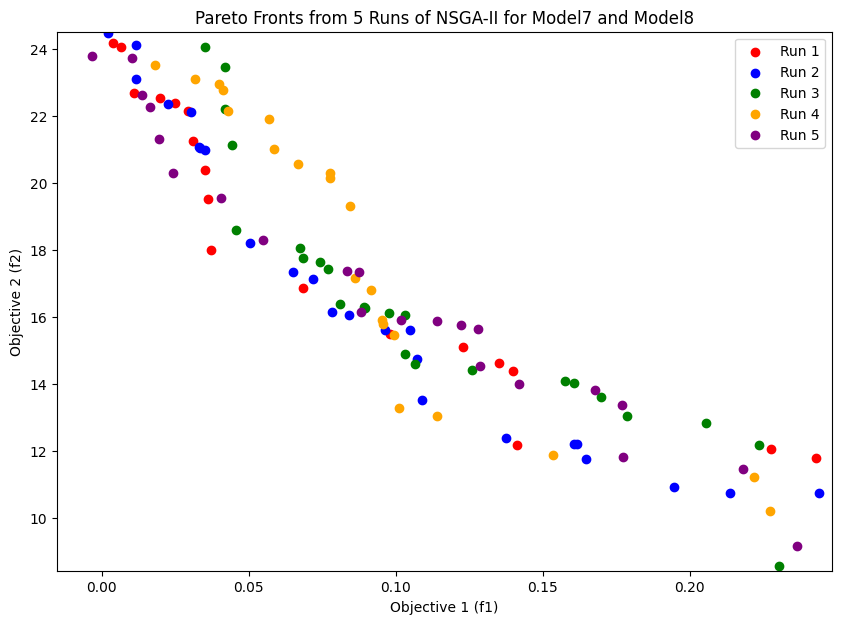

In [ ]:
# Extract the initial values from row 14 for columns X1-X50
initial_values = data.iloc[13, 2:52].values  # Extracting X1-X50 from row 14

# Define the optimization problem
class F1F2Problem(Problem):
    def __init__(self, model_y1, model_y2, initial_values):
        n_var = 70  # Total number of features
        xl_x1_x50 = initial_values  # Fix X1-X50
        xu_x1_x50 = initial_values  # Fix X1-X50

        # Define the range for X51-X70 (10 to 49)
        xl_x51_x70 = np.full(20, 10)
        xu_x51_x70 = np.full(20, 49)

        # Combine all the variable bounds
        xl = np.concatenate((xl_x1_x50, xl_x51_x70))
        xu = np.concatenate((xu_x1_x50, xu_x51_x70))

        super().__init__(n_var=n_var, n_obj=2, n_constr=0, xl=xl, xu=xu)
        self.model_y1 = model_y1
        self.model_y2 = model_y2

    def _evaluate(self, X, out, *args, **kwargs):
        # Reshape X to be 3D as required by LSTM (samples, timesteps, features)
        X_reshaped = X.reshape((X.shape[0], 1, X.shape[1]))

        # Scale the input data
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X_reshaped.reshape(-1, X_reshaped.shape[-1])).reshape(X_reshaped.shape)

        # Predict F1 and F2 using the trained LSTM models
        f1 = self.model_y1.predict(X_scaled)
        f2 = self.model_y2.predict(X_scaled)
        out["F"] = np.column_stack([f1, f2])

# Create the problem instance for model7 and model8
problem = F1F2Problem(model_y1=model7, model_y2=model8, initial_values=initial_values)

# Define the algorithm with updated parameters
algorithm = NSGA2(
    pop_size=200,  # Population size
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.95, eta=10),  # Crossover probability and eta
    mutation=PolynomialMutation(prob=0.25, eta=25)  # Mutation rate
)

# Set up colors for the different runs
colors = ['red', 'blue', 'green', 'orange', 'purple']

# Set a fixed seed for all runs to make them identical
fixed_seed = 42

# Create a figure for the combined plot
plt.figure(figsize=(10, 7))

# Loop to run the optimization 5 times and plot the Pareto fronts in different colors
for i in range(5):
    # Execute the optimization with the fixed seed
    res = minimize(problem, algorithm, ('n_gen', 200), seed=fixed_seed + i, save_history=True, verbose=True)

    # Plot the Pareto Frontier for this run in a different color
    plt.scatter(res.F[:, 0], res.F[:, 1], color=colors[i], label=f'Run {i+1}')

# Calculate the min and max values for f1 and f2 across all runs
f1_min, f1_max = res.F[:, 0].min(), res.F[:, 0].max()
f2_min, f2_max = res.F[:, 1].min(), res.F[:, 1].max()

# Add some padding for better visualization
f1_range = f1_max - f1_min
f2_range = f2_max - f2_min

plt.xlim(f1_min - 0.05 * f1_range, f1_max + 0.05 * f1_range)  # Set the range for f1 on the x-axis
plt.ylim(f2_min - 0.05 * f2_range, f2_max + 0.05 * f2_range)  # Set the range for f2 on the y-axis

# Add labels and legend
plt.xlabel('Objective 1 (f1)')
plt.ylabel('Objective 2 (f2)')
plt.title('Pareto Fronts from 5 Runs of NSGA-II for Model7 and Model8')
plt.legend()
# Show the plot
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



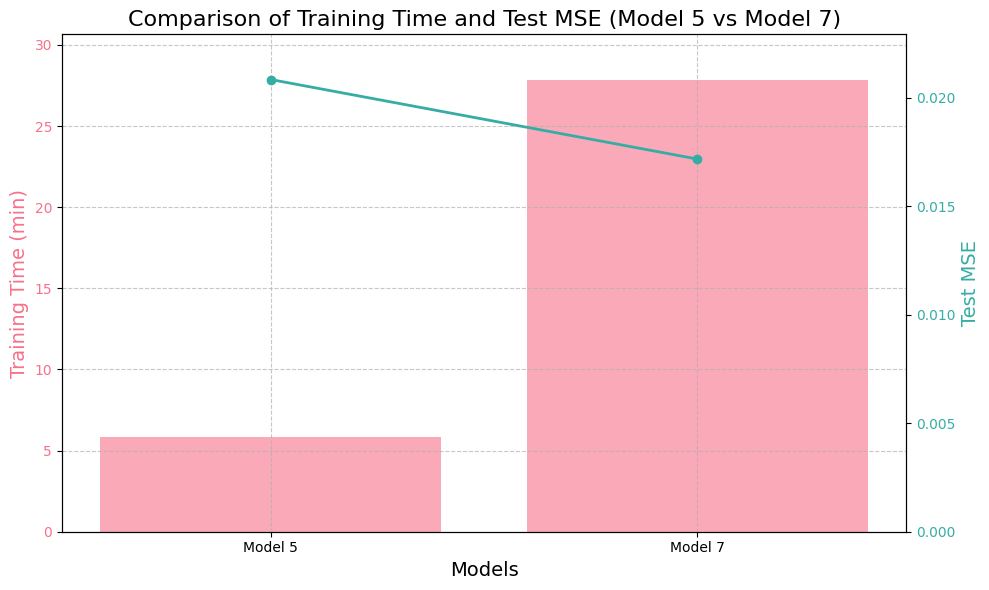

In [ ]:
# Convert training time from seconds to minutes
train_time_model5_minutes = train_time_model5 / 60
train_time_model7_minutes = train_time_model7 / 60

# Data for plotting
models_57 = ['Model 5', 'Model 7']
training_times_57 = [train_time_model5_minutes, train_time_model7_minutes]
test_losses_57 = [test_loss_model5, test_loss_model7]

# Set up the color palette
palette = sns.color_palette("husl", 2)

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot the training time as a bar chart on the left y-axis
ax1.bar(models_57, training_times_57, color=palette[0], alpha=0.6, label='Training Time (min)')
ax1.set_xlabel('Models', fontsize=14)
ax1.set_ylabel('Training Time (min)', fontsize=14, color=palette[0])
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.set_ylim(0, max(training_times_57) * 1.1)  # Start y-axis from 0

# Create the second y-axis for test MSE
ax2 = ax1.twinx()
ax2.plot(models_57, test_losses_57, color=palette[1], marker='o', linestyle='-', linewidth=2, label='Test MSE')
ax2.set_ylabel('Test MSE', fontsize=14, color=palette[1])
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.set_ylim(0, max(test_losses_57) * 1.1)  # Start y-axis from 0

# Add a title and grid
plt.title('Comparison of Training Time and Test MSE (Model 5 vs Model 7)', fontsize=16)
ax1.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to ensure everything fits without overlap
fig.tight_layout()

# Show the plot
plt.show()

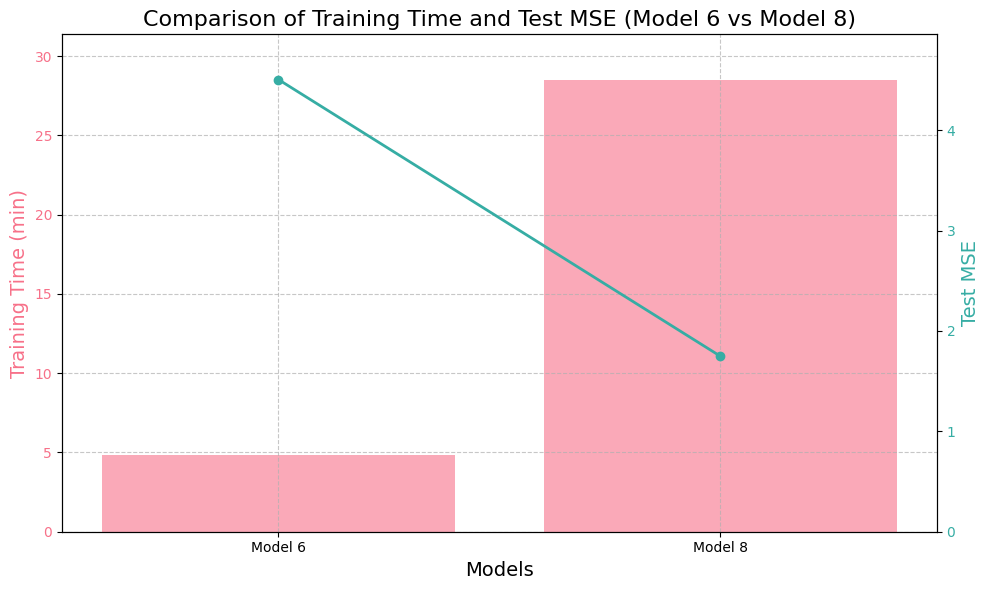

In [ ]:
# Convert training time from seconds to minutes
train_time_model6_minutes = train_time_model6 / 60
train_time_model8_minutes = train_time_model8 / 60

# Data for plotting
models_68 = ['Model 6', 'Model 8']
training_times_68 = [train_time_model6_minutes, train_time_model8_minutes]
test_losses_68 = [test_loss_model6, test_loss_model8]

# Set up the color palette
palette = sns.color_palette("husl", 2)

# Create the figure and axis
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot the training time as a bar chart on the left y-axis
ax1.bar(models_68, training_times_68, color=palette[0], alpha=0.6, label='Training Time (min)')
ax1.set_xlabel('Models', fontsize=14)
ax1.set_ylabel('Training Time (min)', fontsize=14, color=palette[0])
ax1.tick_params(axis='y', labelcolor=palette[0])
ax1.set_ylim(0, max(training_times_68) * 1.1)  # Start y-axis from 0

# Create the second y-axis for test MSE
ax2 = ax1.twinx()
ax2.plot(models_68, test_losses_68, color=palette[1], marker='o', linestyle='-', linewidth=2, label='Test MSE')
ax2.set_ylabel('Test MSE', fontsize=14, color=palette[1])
ax2.tick_params(axis='y', labelcolor=palette[1])
ax2.set_ylim(0, max(test_losses_68) * 1.1)  # Start y-axis from 0

# Add a title and grid
plt.title('Comparison of Training Time and Test MSE (Model 6 vs Model 8)', fontsize=16)
ax1.grid(True, linestyle='--', alpha=0.7)

# Adjust layout to ensure everything fits without overlap
fig.tight_layout()

# Show the plot
plt.show()

In [ ]:
#200，000;0.017
#LSTM, for y1
X = data.drop(columns=['y1','y2'])
y = data['y1']

X = X.values.reshape((X.shape[0], 1, X.shape[1]))

# Divide the training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardised data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)

# Constructing the LSTM model
model = Sequential()
model.add(LSTM(64, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2]), activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1, activation='linear'))

# compilation model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Training Models
history = model.fit(X_train_scaled, y_train, validation_split=0.2, epochs=100, batch_size=32, verbose=1)

# assessment model
test_loss = model.evaluate(X_test_scaled, y_test)
print(f"Test MSE: {test_loss}")

# Predictive test data
y_pred = model.predict(X_test_scaled)

# Showing some predicted results
print(y_pred[:5])

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


4000/4000 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - loss: 0.0464 - val_loss: 0.0301
Epoch 2/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 0.0301 - val_loss: 0.0245
Epoch 3/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - loss: 0.0271 - val_loss: 0.0222
Epoch 4/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step - loss: 0.0250 - val_loss: 0.0210
Epoch 5/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 10s 2ms/step - loss: 0.0237 - val_loss: 0.0212
Epoch 6/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 0.0230 - val_loss: 0.0198
Epoch 7/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 0.0224 - val_loss: 0.0192
Epoch 8/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - loss: 0.0220 - val_loss: 0.0192
Epoch 9/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - loss: 0.0219 - val_loss: 0.0185
Epoch 10/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 35s 7ms/step - loss: 0.0215 - val_loss: 0.0193
Epoch 11/100
4000/4000 ━━━━━━━━━━━━━━━━━━━━ 26s 3ms/step - loss: 0.0213 - val_loss: 0.0187
Epoch 12/100
4000/40